In [2]:
%%capture
!pip install sec-edgar-api
!pip install openmeteo-requests
!pip install requests-cache retry-requests

In [3]:
import yfinance as yf
import pandas as pd
import numpy as np
import requests
import json
import re
import os
from transformers import AutoTokenizer, AutoModelForSequenceClassification
import torch
import requests
import matplotlib.pyplot as plt
from bs4 import BeautifulSoup
from dataclasses import dataclass
from typing import List, Optional, Dict, Any, Tuple
from time import sleep
from sec_edgar_api import EdgarClient
import openmeteo_requests
import requests_cache
from retry_requests import retry
from sklearn.preprocessing import StandardScaler, RobustScaler
import seaborn as sns
import math
import time

In [ ]:
av_api_key = ""

In [5]:
def get_alpha_vantage_data(statement, ticker, token):
  av_params = {
    'symbol': ticker,
    'apikey': token,
    'function': statement
  }
  r = requests.get('https://www.alphavantage.co/query', params=av_params)
  return r.json()

def get_fundamental_factors(ticker, token):
  dfs = []
  for statement in ['INCOME_STATEMENT', 'BALANCE_SHEET', 'CASH_FLOW']:
    data = get_alpha_vantage_data(statement, ticker, token)
    df = pd.DataFrame(data['quarterlyReports'])
    df = df.drop('reportedCurrency', axis=1)
    dfs.append(df)
  return pd.concat(dfs, axis=1)

In [ ]:
duk_fundamentals = get_fundamental_factors('DUK', av_api_key)

In [ ]:
duk_fundamentals

In [ ]:
# we have to look at the three fiscalDatEnding columns from the 3 statements to
# determine a start date
print(duk_fundamentals['fiscalDateEnding'].iloc[:, 0].dropna().iloc[-1])
print(duk_fundamentals['fiscalDateEnding'].iloc[:, 1].dropna().iloc[-1])
print(duk_fundamentals['fiscalDateEnding'].iloc[:, 2].dropna().iloc[-1])

2008-06-30
2009-06-30
2009-06-30


In [ ]:
# check out which columns appear multiple times and how many
duk_fundamentals.columns[duk_fundamentals.columns.duplicated(keep=False)] # need to remove second net income as well likely

Index(['fiscalDateEnding', 'netIncome', 'fiscalDateEnding', 'fiscalDateEnding',
       'netIncome'],
      dtype='object')

In [ ]:
duk_fundamentals['netIncome']

,netIncome,netIncome
0,900000000,900000000
1,1138000000,1138000000
2,1005000000,1005000000
3,1252000000,1252000000
4,-220000000,-220000000
...,...,...
62,276000000,276000000
63,344000000,NaN
64,331000000,NaN
65,215000000,NaN


In [ ]:
# everything is an object - let's set fiscalDateEnding to index and everything else becomes a float
duk_df = duk_fundamentals.copy()
duk_df = duk_df.loc[:, ~duk_df.columns.duplicated()] # drop latter two occurrences of fiscalDateEnding; latter occurrence of netIncome
duk_df = duk_df.set_index('fiscalDateEnding')
duk_df = duk_df.replace('None', np.nan) # lot of 'None' strings
duk_df = duk_df.astype(float)

<ipython-input-12-99ef15c82975>:5: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  duk_df = duk_df.replace('None', np.nan) # lot of 'None' strings


In [ ]:
duk_df

,grossProfit,totalRevenue,costOfRevenue,costofGoodsAndServicesSold,operatingIncome,sellingGeneralAndAdministrative,researchAndDevelopment,operatingExpenses,investmentIncomeNet,netInterestIncome,...,dividendPayout,dividendPayoutCommonStock,dividendPayoutPreferredStock,proceedsFromIssuanceOfCommonStock,proceedsFromIssuanceOfLongTermDebtAndCapitalSecuritiesNet,proceedsFromIssuanceOfPreferredStock,proceedsFromRepurchaseOfEquity,proceedsFromSaleOfTreasuryStock,changeInCashAndCashEquivalents,changeInExchangeRate
fiscalDateEnding,,,,,,,,,,,,,,,,,,,,,
2024-06-30,5.370000e+09,7.172000e+09,1.802000e+09,1.409000e+09,1.707000e+09,393000000.0,NaN,4.220000e+08,NaN,-824000000.0,...,784000000.0,7.840000e+08,NaN,16000000.0,2.891000e+09,NaN,1.600000e+07,NaN,NaN,NaN
2024-03-31,5.081000e+09,6.854000e+09,1.773000e+09,1.387000e+09,1.963000e+09,386000000.0,NaN,3.840000e+08,NaN,-817000000.0,...,806000000.0,8.060000e+08,NaN,4000000.0,3.481000e+09,NaN,4.000000e+06,NaN,NaN,NaN
2023-12-31,4.346000e+09,6.419000e+09,2.073000e+09,1.340000e+09,1.855000e+09,361000000.0,NaN,7.660000e+08,NaN,-793000000.0,...,806000000.0,8.060000e+08,NaN,0.0,1.324000e+09,NaN,1.530000e+09,NaN,NaN,NaN
2023-09-30,5.473000e+09,7.220000e+09,1.747000e+09,1.353000e+09,2.111000e+09,394000000.0,NaN,4.090000e+08,NaN,-774000000.0,...,832000000.0,8.320000e+08,NaN,0.0,1.610000e+09,0.0,0.000000e+00,NaN,NaN,NaN
2023-06-30,4.165000e+09,5.851000e+09,1.686000e+09,1.333000e+09,1.430000e+09,353000000.0,NaN,3.450000e+08,NaN,-727000000.0,...,791000000.0,1.606000e+09,NaN,0.0,3.009000e+09,0.0,0.000000e+00,NaN,-57000000.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2009-06-30,1.417000e+09,2.913000e+09,1.496000e+09,9.290000e+08,5.280000e+08,160000000.0,NaN,7.530000e+08,NaN,-186000000.0,...,333000000.0,3.330000e+08,NaN,110000000.0,NaN,NaN,1.100000e+08,NaN,727000000.0,NaN
2009-03-31,2.093000e+09,3.312000e+09,1.219000e+09,1.219000e+09,6.810000e+08,NaN,NaN,1.418000e+09,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2008-12-31,1.881000e+09,3.133000e+09,1.252000e+09,1.252000e+09,5.000000e+08,NaN,NaN,1.406000e+09,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# duk_df.to_csv('/content/drive/My Drive/GitHubPortfolio/QuantDevProject/data/raw_alpha_vantage.csv')

In [8]:
duk_df = pd.read_csv('/content/drive/My Drive/GitHubPortfolio/QuantDevProject/data/raw_alpha_vantage.csv')
duk_df = duk_df.set_index('fiscalDateEnding').sort_index(ascending=True)
duk_df

,grossProfit,totalRevenue,costOfRevenue,costofGoodsAndServicesSold,operatingIncome,sellingGeneralAndAdministrative,researchAndDevelopment,operatingExpenses,investmentIncomeNet,netInterestIncome,...,dividendPayout,dividendPayoutCommonStock,dividendPayoutPreferredStock,proceedsFromIssuanceOfCommonStock,proceedsFromIssuanceOfLongTermDebtAndCapitalSecuritiesNet,proceedsFromIssuanceOfPreferredStock,proceedsFromRepurchaseOfEquity,proceedsFromSaleOfTreasuryStock,changeInCashAndCashEquivalents,changeInExchangeRate
fiscalDateEnding,,,,,,,,,,,,,,,,,,,,,
2008-06-30,2.103000e+09,3.229000e+09,1.126000e+09,1.126000e+09,6.830000e+08,NaN,NaN,1.453000e+09,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2008-09-30,2.097000e+09,3.508000e+09,1.411000e+09,1.411000e+09,5.770000e+08,NaN,NaN,1.522000e+09,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2008-12-31,1.881000e+09,3.133000e+09,1.252000e+09,1.252000e+09,5.000000e+08,NaN,NaN,1.406000e+09,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2009-03-31,2.093000e+09,3.312000e+09,1.219000e+09,1.219000e+09,6.810000e+08,NaN,NaN,1.418000e+09,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2009-06-30,1.417000e+09,2.913000e+09,1.496000e+09,9.290000e+08,5.280000e+08,160000000.0,NaN,7.530000e+08,NaN,-186000000.0,...,333000000.0,3.330000e+08,NaN,110000000.0,NaN,NaN,1.100000e+08,NaN,727000000.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-06-30,4.165000e+09,5.851000e+09,1.686000e+09,1.333000e+09,1.430000e+09,353000000.0,NaN,3.450000e+08,NaN,-727000000.0,...,791000000.0,1.606000e+09,NaN,0.0,3.009000e+09,0.0,0.000000e+00,NaN,-57000000.0,NaN
2023-09-30,5.473000e+09,7.220000e+09,1.747000e+09,1.353000e+09,2.111000e+09,394000000.0,NaN,4.090000e+08,NaN,-774000000.0,...,832000000.0,8.320000e+08,NaN,0.0,1.610000e+09,0.0,0.000000e+00,NaN,NaN,NaN
2023-12-31,4.346000e+09,6.419000e+09,2.073000e+09,1.340000e+09,1.855000e+09,361000000.0,NaN,7.660000e+08,NaN,-793000000.0,...,806000000.0,8.060000e+08,NaN,0.0,1.324000e+09,NaN,1.530000e+09,NaN,NaN,NaN


In [9]:
def plot_timeseries_grid(df, plots_per_row=3, height_per_plot=3, width_per_plot=5, h_spacing=0.4, v_spacing=0.6):
    """
    Create a grid of time series plots from a pandas DataFrame with datetime index.

    Parameters:
    -----------
    df : pandas.DataFrame
        DataFrame with datetime index and numeric columns to plot
    plots_per_row : int, optional
        Number of plots per row in the grid, default 3
    height_per_plot : float, optional
        Height allocated for each subplot in inches, default 3
    width_per_plot : float, optional
        Width allocated for each subplot in inches, default 5
    h_spacing : float, optional
        Horizontal spacing between subplots, default 0.4
    v_spacing : float, optional
        Vertical spacing between subplots, default 0.6

    Returns:
    --------
    fig : matplotlib.figure.Figure
        The figure containing all subplots
    """

    # Calculate grid dimensions
    n_plots = len(df.columns)
    n_rows = int(np.ceil(n_plots / plots_per_row))

    # Calculate figure size based on number of plots and spacing
    fig_width = width_per_plot * min(n_plots, plots_per_row)
    fig_height = height_per_plot * n_rows

    # Create figure
    fig = plt.figure(figsize=(fig_width, fig_height))

    # Calculate subplot parameters to achieve desired spacing
    top = 1 - 0.1/(n_rows)  # Small top margin
    bottom = 0.2/n_rows     # Larger bottom margin for dates
    left = 0.1              # Left margin
    right = 0.95           # Right margin

    # Create subplot grid with specified spacing
    gs = fig.add_gridspec(n_rows, plots_per_row,
                         hspace=v_spacing,
                         wspace=h_spacing,
                         top=top, bottom=bottom,
                         left=left, right=right)

    # Create each subplot
    for i, column in enumerate(df.columns):
        row = i // plots_per_row
        col = i % plots_per_row
        ax = fig.add_subplot(gs[row, col])

        # Plot the data
        df[column].plot(ax=ax)
        ax.set_title(column, pad=10)
        ax.tick_params(axis='x', rotation=45)
        ax.grid(True)

        # Format y-axis to prevent scientific notation
        ax.yaxis.set_major_formatter(plt.FormatStrFormatter('%.2f'))

        # Only show every nth x-tick to prevent overcrowding
        n_ticks = 5
        ax.xaxis.set_major_locator(plt.MaxNLocator(n_ticks))

    # Add overall title
    fig.suptitle('Time Series by Column', y=1.02, fontsize=16)

    return fig

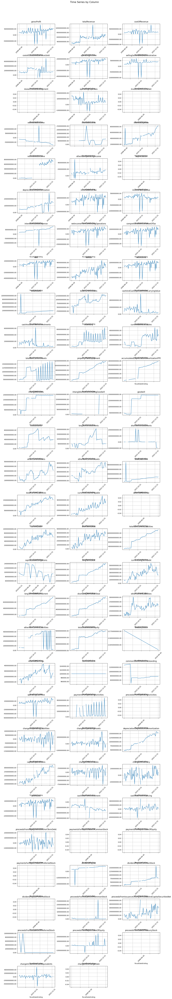

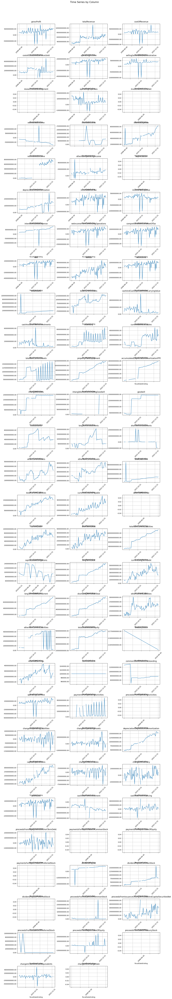

In [10]:
plot_timeseries_grid(duk_df)

A number of issues arise here clearly:


*   Some columns have lots of missing data
*   Some columns have sparse missing data in the middle (or beginning/end) of the dataset
*   Some data looks irrelevant (there's never any value at all)



In [11]:
none_percentage = 100*duk_df.isna().mean().sort_values(ascending=False)
none_percentage

,0
changeInExchangeRate,100.0
deferredRevenue,100.0
proceedsFromSaleOfTreasuryStock,100.0
dividendPayoutPreferredStock,100.0
researchAndDevelopment,100.0
...,...
operatingExpenses,0.0
netIncome,0.0
operatingIncome,0.0
costOfRevenue,0.0


In [12]:
columns_above_25_missing = none_percentage[none_percentage > 25].index
columns_above_25_missing

Index(['changeInExchangeRate', 'deferredRevenue',
       'proceedsFromSaleOfTreasuryStock', 'dividendPayoutPreferredStock',
       'researchAndDevelopment', 'paymentsForRepurchaseOfPreferredStock',
       'investmentIncomeNet', 'paymentsForRepurchaseOfEquity',
       'paymentsForRepurchaseOfCommonStock', 'proceedsFromOperatingActivities',
       'depreciation', 'treasuryStock', 'proceedsFromIssuanceOfPreferredStock',
       'interestIncome', 'capitalLeaseObligations',
       'accumulatedDepreciationAmortizationPPE',
       'intangibleAssetsExcludingGoodwill', 'paymentsForOperatingActivities',
       'shortTermInvestments', 'nonInterestIncome'],
      dtype='object')

In [13]:
len(columns_above_25_missing)

20

#### Let's just look at what columns have over 10% of missing data as well

In [14]:
columns_above_10_missing = none_percentage[none_percentage > 10].index
columns_above_10_missing

Index(['changeInExchangeRate', 'deferredRevenue',
       'proceedsFromSaleOfTreasuryStock', 'dividendPayoutPreferredStock',
       'researchAndDevelopment', 'paymentsForRepurchaseOfPreferredStock',
       'investmentIncomeNet', 'paymentsForRepurchaseOfEquity',
       'paymentsForRepurchaseOfCommonStock', 'proceedsFromOperatingActivities',
       'depreciation', 'treasuryStock', 'proceedsFromIssuanceOfPreferredStock',
       'interestIncome', 'capitalLeaseObligations',
       'accumulatedDepreciationAmortizationPPE',
       'intangibleAssetsExcludingGoodwill', 'paymentsForOperatingActivities',
       'shortTermInvestments', 'nonInterestIncome',
       'otherNonCurrentLiabilities', 'changeInCashAndCashEquivalents',
       'propertyPlantEquipment', 'intangibleAssets', 'currentAccountsPayable',
       'longTermDebtNoncurrent', 'changeInReceivables', 'currentLongTermDebt',
       'proceedsFromIssuanceOfLongTermDebtAndCapitalSecuritiesNet',
       'currentNetReceivables', 'changeInOperatingL

In [15]:
len(columns_above_10_missing)

35

#### This starts to incorporate data that likely may have missing data by design (e.g. PPE, currentAP, etc.) and we actually care about keeping it around. Let's keep the threshold at 25%.

In [16]:
duk_df = duk_df.drop(columns=columns_above_25_missing)

### I'd like to look at columns that are also only 0 or predominantly 0.

In [17]:
zero_percentage = ((duk_df == 0.0).mean() * 100).sort_values(ascending=False)
zero_percentage

,0
proceedsFromIssuanceOfCommonStock,64.179104
proceedsFromRepurchaseOfEquity,25.373134
proceedsFromIssuanceOfLongTermDebtAndCapitalSecuritiesNet,2.985075
proceedsFromRepaymentsOfShortTermDebt,1.492537
shortTermDebt,1.492537
...,...
intangibleAssets,0.000000
goodwill,0.000000
investments,0.000000
longTermInvestments,0.000000


In [18]:
columns_above_25_zeros = zero_percentage[zero_percentage > 25].index
columns_above_25_zeros

Index(['proceedsFromIssuanceOfCommonStock', 'proceedsFromRepurchaseOfEquity'], dtype='object')

In [19]:
duk_df = duk_df.drop(columns=columns_above_25_zeros)
duk_df

,grossProfit,totalRevenue,costOfRevenue,costofGoodsAndServicesSold,operatingIncome,sellingGeneralAndAdministrative,operatingExpenses,netInterestIncome,interestExpense,otherNonOperatingIncome,...,changeInReceivables,changeInInventory,profitLoss,cashflowFromInvestment,cashflowFromFinancing,proceedsFromRepaymentsOfShortTermDebt,dividendPayout,dividendPayoutCommonStock,proceedsFromIssuanceOfLongTermDebtAndCapitalSecuritiesNet,changeInCashAndCashEquivalents
fiscalDateEnding,,,,,,,,,,,,,,,,,,,,,
2008-06-30,2.103000e+09,3.229000e+09,1.126000e+09,1.126000e+09,6.830000e+08,NaN,1.453000e+09,NaN,194000000.0,75000000.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2008-09-30,2.097000e+09,3.508000e+09,1.411000e+09,1.411000e+09,5.770000e+08,NaN,1.522000e+09,NaN,176000000.0,33000000.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2008-12-31,1.881000e+09,3.133000e+09,1.252000e+09,1.252000e+09,5.000000e+08,NaN,1.406000e+09,NaN,741000000.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2009-03-31,2.093000e+09,3.312000e+09,1.219000e+09,1.219000e+09,6.810000e+08,NaN,1.418000e+09,NaN,184000000.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2009-06-30,1.417000e+09,2.913000e+09,1.496000e+09,9.290000e+08,5.280000e+08,160000000.0,7.530000e+08,-186000000.0,186000000.0,100000000.0,...,NaN,-117000000.0,2.820000e+08,-2.133000e+09,1.100000e+08,0.000000e+00,333000000.0,3.330000e+08,NaN,727000000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-06-30,4.165000e+09,5.851000e+09,1.686000e+09,1.333000e+09,1.430000e+09,353000000.0,3.450000e+08,-727000000.0,727000000.0,147000000.0,...,168000000.0,242000000.0,-2.040000e+08,-3.299000e+09,9.400000e+08,-3.730000e+08,791000000.0,1.606000e+09,3.009000e+09,-57000000.0
2023-09-30,5.473000e+09,7.220000e+09,1.747000e+09,1.353000e+09,2.111000e+09,394000000.0,4.090000e+08,-774000000.0,774000000.0,133000000.0,...,105000000.0,14000000.0,1.321000e+09,-3.243000e+09,-2.740000e+08,-8.140000e+08,832000000.0,8.320000e+08,1.610000e+09,NaN
2023-12-31,4.346000e+09,6.419000e+09,2.073000e+09,1.340000e+09,1.855000e+09,361000000.0,7.660000e+08,-793000000.0,793000000.0,167000000.0,...,38000000.0,175000000.0,9.960000e+08,-2.724000e+09,-6.200000e+07,1.061000e+09,806000000.0,8.060000e+08,1.324000e+09,NaN


### Now need to handle the remaining missing values
For simplicity's sake, first we'll forward fill missing values as we want to carry forward the values we knew at that particular time (especially at time periods towards the end where don't have updated values yet). Then we'll backfill the leading NaNs with values we have for the most recent value available at the beginning.

First, we need to truncate the series to 2009-06-30 since not all statements went back to 2008-06-30. It's time we reversed the order of the time series so as not to cause any more confusion here.

In [20]:
duk_df = duk_df.sort_index(ascending=True)
duk_df

,grossProfit,totalRevenue,costOfRevenue,costofGoodsAndServicesSold,operatingIncome,sellingGeneralAndAdministrative,operatingExpenses,netInterestIncome,interestExpense,otherNonOperatingIncome,...,changeInReceivables,changeInInventory,profitLoss,cashflowFromInvestment,cashflowFromFinancing,proceedsFromRepaymentsOfShortTermDebt,dividendPayout,dividendPayoutCommonStock,proceedsFromIssuanceOfLongTermDebtAndCapitalSecuritiesNet,changeInCashAndCashEquivalents
fiscalDateEnding,,,,,,,,,,,,,,,,,,,,,
2008-06-30,2.103000e+09,3.229000e+09,1.126000e+09,1.126000e+09,6.830000e+08,NaN,1.453000e+09,NaN,194000000.0,75000000.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2008-09-30,2.097000e+09,3.508000e+09,1.411000e+09,1.411000e+09,5.770000e+08,NaN,1.522000e+09,NaN,176000000.0,33000000.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2008-12-31,1.881000e+09,3.133000e+09,1.252000e+09,1.252000e+09,5.000000e+08,NaN,1.406000e+09,NaN,741000000.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2009-03-31,2.093000e+09,3.312000e+09,1.219000e+09,1.219000e+09,6.810000e+08,NaN,1.418000e+09,NaN,184000000.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2009-06-30,1.417000e+09,2.913000e+09,1.496000e+09,9.290000e+08,5.280000e+08,160000000.0,7.530000e+08,-186000000.0,186000000.0,100000000.0,...,NaN,-117000000.0,2.820000e+08,-2.133000e+09,1.100000e+08,0.000000e+00,333000000.0,3.330000e+08,NaN,727000000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-06-30,4.165000e+09,5.851000e+09,1.686000e+09,1.333000e+09,1.430000e+09,353000000.0,3.450000e+08,-727000000.0,727000000.0,147000000.0,...,168000000.0,242000000.0,-2.040000e+08,-3.299000e+09,9.400000e+08,-3.730000e+08,791000000.0,1.606000e+09,3.009000e+09,-57000000.0
2023-09-30,5.473000e+09,7.220000e+09,1.747000e+09,1.353000e+09,2.111000e+09,394000000.0,4.090000e+08,-774000000.0,774000000.0,133000000.0,...,105000000.0,14000000.0,1.321000e+09,-3.243000e+09,-2.740000e+08,-8.140000e+08,832000000.0,8.320000e+08,1.610000e+09,NaN
2023-12-31,4.346000e+09,6.419000e+09,2.073000e+09,1.340000e+09,1.855000e+09,361000000.0,7.660000e+08,-793000000.0,793000000.0,167000000.0,...,38000000.0,175000000.0,9.960000e+08,-2.724000e+09,-6.200000e+07,1.061000e+09,806000000.0,8.060000e+08,1.324000e+09,NaN


In [21]:
duk_df = duk_df.loc['2009-06-30':]
duk_df

,grossProfit,totalRevenue,costOfRevenue,costofGoodsAndServicesSold,operatingIncome,sellingGeneralAndAdministrative,operatingExpenses,netInterestIncome,interestExpense,otherNonOperatingIncome,...,changeInReceivables,changeInInventory,profitLoss,cashflowFromInvestment,cashflowFromFinancing,proceedsFromRepaymentsOfShortTermDebt,dividendPayout,dividendPayoutCommonStock,proceedsFromIssuanceOfLongTermDebtAndCapitalSecuritiesNet,changeInCashAndCashEquivalents
fiscalDateEnding,,,,,,,,,,,,,,,,,,,,,
2009-06-30,1.417000e+09,2.913000e+09,1.496000e+09,9.290000e+08,5.280000e+08,160000000.0,7.530000e+08,-186000000.0,186000000.0,100000000.0,...,NaN,-117000000.0,2.820000e+08,-2.133000e+09,1.100000e+08,0.000000e+00,333000000.0,3.330000e+08,NaN,727000000.0
2009-09-30,1.692000e+09,3.396000e+09,1.704000e+09,1.097000e+09,4.450000e+08,175000000.0,8.000000e+08,-190000000.0,190000000.0,-82000000.0,...,-26000000.0,52000000.0,1.060000e+08,-1.088000e+09,4.630000e+08,-1.200000e+08,312000000.0,2.790000e+08,1.293000e+09,900000000.0
2009-12-31,3.110000e+09,3.110000e+09,1.548000e+09,9.880000e+08,5.950000e+08,157000000.0,7.630000e+08,-191000000.0,191000000.0,494000000.0,...,264000000.0,19000000.0,3.480000e+08,-1.271000e+09,2.860000e+08,-2.800000e+08,314000000.0,3.510000e+08,1.052000e+09,-64000000.0
2010-03-31,3.594000e+09,3.594000e+09,1.814000e+09,1.097000e+09,7.610000e+08,193000000.0,9.270000e+08,-210000000.0,210000000.0,-91000000.0,...,-94000000.0,-180000000.0,4.450000e+08,-1.236000e+09,-3.470000e+08,9.300000e+07,316000000.0,3.160000e+08,4.510000e+08,-462000000.0
2010-06-30,9.010000e+08,3.287000e+09,2.386000e+09,1.141000e+09,-1.400000e+07,163000000.0,1.457000e+09,-212000000.0,212000000.0,88000000.0,...,31000000.0,-37000000.0,-2.170000e+08,-1.272000e+09,1.990000e+08,-1.090000e+08,319000000.0,3.190000e+08,9.120000e+08,-70000000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-06-30,4.165000e+09,5.851000e+09,1.686000e+09,1.333000e+09,1.430000e+09,353000000.0,3.450000e+08,-727000000.0,727000000.0,147000000.0,...,168000000.0,242000000.0,-2.040000e+08,-3.299000e+09,9.400000e+08,-3.730000e+08,791000000.0,1.606000e+09,3.009000e+09,-57000000.0
2023-09-30,5.473000e+09,7.220000e+09,1.747000e+09,1.353000e+09,2.111000e+09,394000000.0,4.090000e+08,-774000000.0,774000000.0,133000000.0,...,105000000.0,14000000.0,1.321000e+09,-3.243000e+09,-2.740000e+08,-8.140000e+08,832000000.0,8.320000e+08,1.610000e+09,NaN
2023-12-31,4.346000e+09,6.419000e+09,2.073000e+09,1.340000e+09,1.855000e+09,361000000.0,7.660000e+08,-793000000.0,793000000.0,167000000.0,...,38000000.0,175000000.0,9.960000e+08,-2.724000e+09,-6.200000e+07,1.061000e+09,806000000.0,8.060000e+08,1.324000e+09,NaN


In [22]:
duk_df = duk_df.ffill().bfill()
duk_df

,grossProfit,totalRevenue,costOfRevenue,costofGoodsAndServicesSold,operatingIncome,sellingGeneralAndAdministrative,operatingExpenses,netInterestIncome,interestExpense,otherNonOperatingIncome,...,changeInReceivables,changeInInventory,profitLoss,cashflowFromInvestment,cashflowFromFinancing,proceedsFromRepaymentsOfShortTermDebt,dividendPayout,dividendPayoutCommonStock,proceedsFromIssuanceOfLongTermDebtAndCapitalSecuritiesNet,changeInCashAndCashEquivalents
fiscalDateEnding,,,,,,,,,,,,,,,,,,,,,
2009-06-30,1.417000e+09,2.913000e+09,1.496000e+09,9.290000e+08,5.280000e+08,160000000.0,7.530000e+08,-186000000.0,186000000.0,100000000.0,...,-26000000.0,-117000000.0,2.820000e+08,-2.133000e+09,1.100000e+08,0.000000e+00,333000000.0,3.330000e+08,1.293000e+09,727000000.0
2009-09-30,1.692000e+09,3.396000e+09,1.704000e+09,1.097000e+09,4.450000e+08,175000000.0,8.000000e+08,-190000000.0,190000000.0,-82000000.0,...,-26000000.0,52000000.0,1.060000e+08,-1.088000e+09,4.630000e+08,-1.200000e+08,312000000.0,2.790000e+08,1.293000e+09,900000000.0
2009-12-31,3.110000e+09,3.110000e+09,1.548000e+09,9.880000e+08,5.950000e+08,157000000.0,7.630000e+08,-191000000.0,191000000.0,494000000.0,...,264000000.0,19000000.0,3.480000e+08,-1.271000e+09,2.860000e+08,-2.800000e+08,314000000.0,3.510000e+08,1.052000e+09,-64000000.0
2010-03-31,3.594000e+09,3.594000e+09,1.814000e+09,1.097000e+09,7.610000e+08,193000000.0,9.270000e+08,-210000000.0,210000000.0,-91000000.0,...,-94000000.0,-180000000.0,4.450000e+08,-1.236000e+09,-3.470000e+08,9.300000e+07,316000000.0,3.160000e+08,4.510000e+08,-462000000.0
2010-06-30,9.010000e+08,3.287000e+09,2.386000e+09,1.141000e+09,-1.400000e+07,163000000.0,1.457000e+09,-212000000.0,212000000.0,88000000.0,...,31000000.0,-37000000.0,-2.170000e+08,-1.272000e+09,1.990000e+08,-1.090000e+08,319000000.0,3.190000e+08,9.120000e+08,-70000000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-06-30,4.165000e+09,5.851000e+09,1.686000e+09,1.333000e+09,1.430000e+09,353000000.0,3.450000e+08,-727000000.0,727000000.0,147000000.0,...,168000000.0,242000000.0,-2.040000e+08,-3.299000e+09,9.400000e+08,-3.730000e+08,791000000.0,1.606000e+09,3.009000e+09,-57000000.0
2023-09-30,5.473000e+09,7.220000e+09,1.747000e+09,1.353000e+09,2.111000e+09,394000000.0,4.090000e+08,-774000000.0,774000000.0,133000000.0,...,105000000.0,14000000.0,1.321000e+09,-3.243000e+09,-2.740000e+08,-8.140000e+08,832000000.0,8.320000e+08,1.610000e+09,-57000000.0
2023-12-31,4.346000e+09,6.419000e+09,2.073000e+09,1.340000e+09,1.855000e+09,361000000.0,7.660000e+08,-793000000.0,793000000.0,167000000.0,...,38000000.0,175000000.0,9.960000e+08,-2.724000e+09,-6.200000e+07,1.061000e+09,806000000.0,8.060000e+08,1.324000e+09,-57000000.0


In [23]:
duk_df.isna().sum().sum() # confirm all NaNs have been handled

0

In [24]:
"""
Let's look at a few utility industry financial statement ratios that might be important
https://insightsoftware.com/blog/top-five-financial-kpis-for-utilities-industry/

Liquidity ratio *
Debt-to-equity ratio *
Debt-to-asset ratio *
Debt service coverage ratio *
Return on Assets (ROA) *
Return on Equity (ROE) *
Net Profit Margin *
Capital Expenditure (CapEx) Efficiency *
Interest coverage ratio *
Asset turnover ratio
Cost of capital *
"""

"\nLet's look at a few utility industry financial statement ratios that might be important\nhttps://insightsoftware.com/blog/top-five-financial-kpis-for-utilities-industry/\n\nLiquidity ratio *\nDebt-to-equity ratio *\nDebt-to-asset ratio *\nDebt service coverage ratio *\nReturn on Assets (ROA) *\nReturn on Equity (ROE) *\nNet Profit Margin *\nCapital Expenditure (CapEx) Efficiency *\nInterest coverage ratio *\nAsset turnover ratio\nCost of capital *\n"

In [25]:
duk_df['netProfitMargin'] = duk_df['netIncome']/duk_df['totalRevenue']
duk_df['ROA'] = duk_df['netIncome']/duk_df['totalAssets']
duk_df['ROE'] = duk_df['netIncome']/duk_df['totalShareholderEquity']
duk_df['debtEquityRatio'] = duk_df['shortLongTermDebtTotal']/duk_df['totalShareholderEquity']
duk_df['debtAssetRatio'] = duk_df['shortLongTermDebtTotal']/duk_df['totalAssets']
duk_df['interestCoverageRatio'] = duk_df['ebit']/duk_df['interestExpense']
duk_df['assetTurnoverRatio'] = duk_df['totalRevenue']/duk_df['totalAssets']
duk_df['currentRatio'] = duk_df['totalCurrentAssets']/duk_df['totalCurrentLiabilities']
duk_df['quickRatio'] = (duk_df['totalCurrentAssets'] - duk_df['inventory'])/duk_df['totalCurrentLiabilities']
duk_df['cashRatio'] = duk_df['cashAndCashEquivalentsAtCarryingValue']/duk_df['totalCurrentLiabilities']
duk_df['capitalExpenditureEfficiency'] = duk_df['operatingCashflow']/duk_df['capitalExpenditures']
duk_df['debtServiceCoverageRatio'] = duk_df['operatingIncome']/duk_df['interestAndDebtExpense']

In [26]:
# keep only the ratios of interest
ratios = ['netProfitMargin', 'ROA', 'ROE', 'debtEquityRatio', 'debtAssetRatio', 'interestCoverageRatio', 'assetTurnoverRatio', 'currentRatio', 'quickRatio', 'cashRatio', 'capitalExpenditureEfficiency', 'debtServiceCoverageRatio']

duk_df = duk_df[ratios]
duk_df.head(2)

,netProfitMargin,ROA,ROE,debtEquityRatio,debtAssetRatio,interestCoverageRatio,assetTurnoverRatio,currentRatio,quickRatio,cashRatio,capitalExpenditureEfficiency,debtServiceCoverageRatio
fiscalDateEnding,,,,,,,,,,,,
2009-06-30,0.094748,0.005045,0.013003,0.741214,0.287576,2.838710,0.053245,1.301859,0.971504,0.17049,0.680712,2.838710
2009-09-30,0.032097,0.001992,0.005135,0.741214,0.287576,2.342105,0.062074,1.301859,0.971504,0.17049,1.356762,2.342105


In [27]:
# add in temporal adjustments
for col in duk_df.columns:
  duk_df[f'{col}_QoQ_Growth'] = duk_df[col].pct_change()
  duk_df[f'{col}_4Q_MA'] = duk_df[col].rolling(4).mean()
  duk_df[f'{col}_12Q_MA'] = duk_df[col].rolling(12).mean()
  epsilon = 1e-10
  denominator = duk_df[col].shift(4).replace(0, epsilon)
  duk_df[f'{col}_YOY'] = (duk_df[col] / denominator) - 1

<ipython-input-27-7a6293312231>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  duk_df[f'{col}_QoQ_Growth'] = duk_df[col].pct_change()
<ipython-input-27-7a6293312231>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  duk_df[f'{col}_4Q_MA'] = duk_df[col].rolling(4).mean()
<ipython-input-27-7a6293312231>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pyd

In [28]:
duk_df.dropna(inplace=True)

<ipython-input-28-a2f0df1ae1d4>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  duk_df.dropna(inplace=True)


Let's now investigate if some of these factors are heavily correlated and we can get rid of some.

In [29]:
correlation_matrix = duk_df.corr().abs()
upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
threshold = 0.9
to_drop = [column for column in upper_triangle.columns if any(upper_triangle[column] > threshold)]
duk_df = duk_df.drop(columns=to_drop)

In [30]:
to_drop

['ROA',
 'ROE',
 'debtAssetRatio',
 'interestCoverageRatio',
 'capitalExpenditureEfficiency',
 'debtServiceCoverageRatio',
 'ROA_QoQ_Growth',
 'ROA_YOY',
 'ROE_QoQ_Growth',
 'ROE_4Q_MA',
 'ROE_12Q_MA',
 'ROE_YOY',
 'debtEquityRatio_4Q_MA',
 'debtEquityRatio_12Q_MA',
 'debtAssetRatio_QoQ_Growth',
 'debtAssetRatio_4Q_MA',
 'debtAssetRatio_12Q_MA',
 'interestCoverageRatio_4Q_MA',
 'interestCoverageRatio_12Q_MA',
 'assetTurnoverRatio_12Q_MA',
 'currentRatio_4Q_MA',
 'currentRatio_12Q_MA',
 'quickRatio_4Q_MA',
 'quickRatio_12Q_MA',
 'cashRatio_4Q_MA',
 'cashRatio_12Q_MA',
 'capitalExpenditureEfficiency_4Q_MA',
 'capitalExpenditureEfficiency_12Q_MA',
 'debtServiceCoverageRatio_4Q_MA',
 'debtServiceCoverageRatio_12Q_MA']

In [31]:
duk_df.head()

,netProfitMargin,debtEquityRatio,assetTurnoverRatio,currentRatio,quickRatio,cashRatio,netProfitMargin_QoQ_Growth,netProfitMargin_4Q_MA,netProfitMargin_12Q_MA,netProfitMargin_YOY,...,currentRatio_QoQ_Growth,currentRatio_YOY,quickRatio_QoQ_Growth,quickRatio_YOY,cashRatio_QoQ_Growth,cashRatio_YOY,capitalExpenditureEfficiency_QoQ_Growth,capitalExpenditureEfficiency_YOY,debtServiceCoverageRatio_QoQ_Growth,debtServiceCoverageRatio_YOY
fiscalDateEnding,,,,,,,,,,,,,,,,,,,,,
2012-03-31,0.081267,0.849215,0.059728,1.226393,0.948583,0.397263,-0.049625,0.102235,0.094713,-0.417452,...,-0.045268,-0.255470,-0.013870,-0.276772,0.279292,-0.194708,0.878756,-0.076080,-0.042553,-0.405466
2012-06-30,0.124126,0.910197,0.057208,1.244573,0.957308,0.381693,0.527385,0.102494,0.097162,0.008420,...,0.014824,-0.220617,0.009199,-0.239423,-0.039193,-0.109306,0.012912,0.102111,0.533124,0.012887
2012-09-30,0.088367,0.880295,0.108772,1.383143,0.973617,0.250058,-0.288092,0.094818,0.101851,-0.257871,...,0.111339,0.046898,0.017036,-0.026615,-0.344871,-0.260398,0.388224,-0.003367,-0.206513,-0.253450
2012-12-31,0.076383,0.913109,0.090352,1.056687,0.769669,0.248575,-0.135614,0.092536,0.098945,-0.106746,...,-0.236025,-0.177382,-0.209474,-0.199865,-0.005933,-0.199524,-0.384484,0.626077,-0.258928,-0.136838
2013-03-31,0.107494,0.942696,0.052657,1.181159,0.825736,0.205820,0.407307,0.099092,0.097584,0.322724,...,0.117795,-0.036883,0.072846,-0.129505,-0.171997,-0.481904,0.038704,-0.100994,0.721968,0.552396


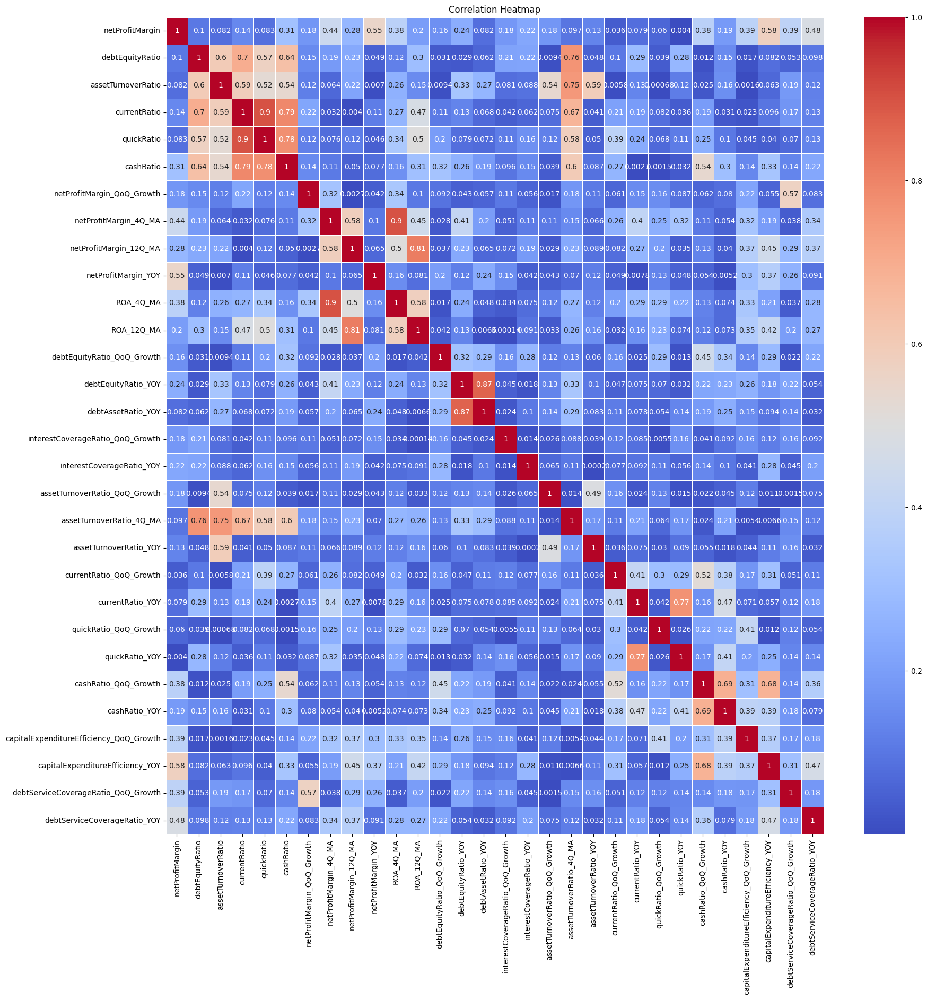

In [32]:
correlation_matrix = duk_df.corr().abs()
plt.figure(figsize=(20, 20))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Heatmap')
plt.show()

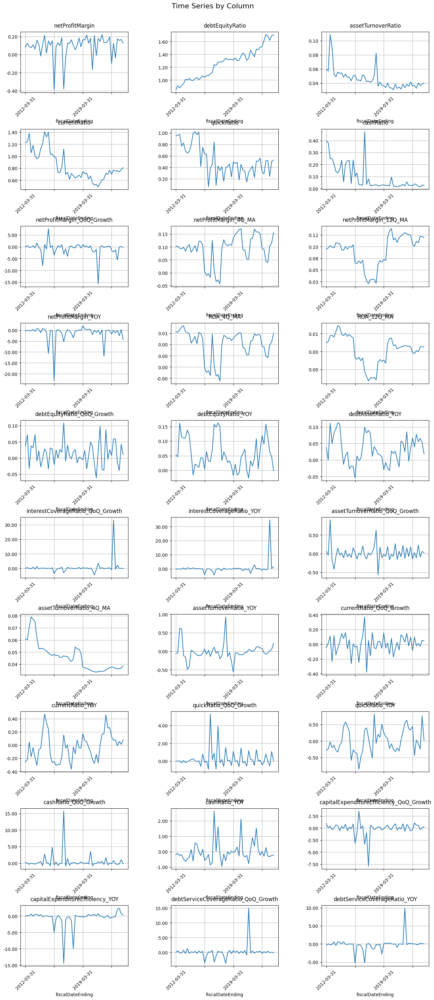

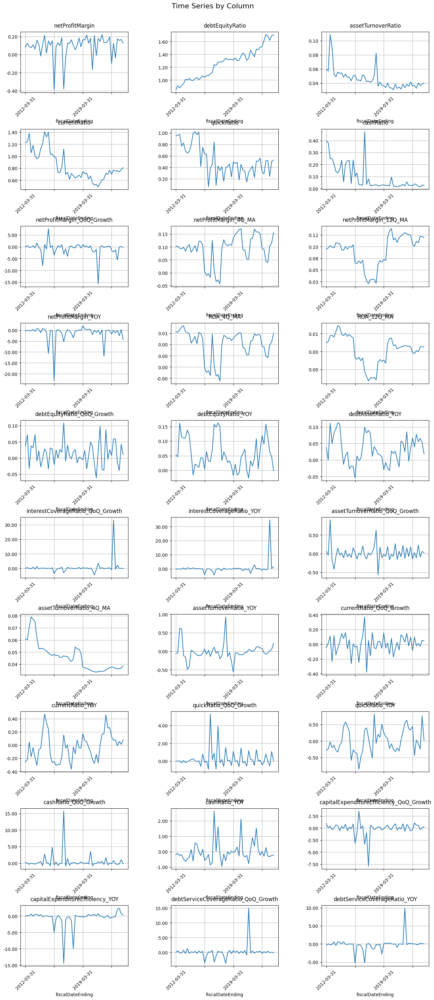

In [33]:
plot_timeseries_grid(duk_df)

There are some series with some big outliers. Let's see if we can handle these accordingly... first let's look at interestCoverageRatio_QoQ_Growth

In [34]:
def winsorize_data(data, lower_percentile_threshold, upper_percentile_threshold):
    """
    Winsorize data by clipping extreme outliers in both directions.

    Parameters:
    data (numpy.ndarray or pandas.Series): 1D array
    lower_percentile_threshold (float): Lower percentile threshold for outlier detection
    upper_percentile_threshold (float): Upper percentile threshold for outlier detection

    Returns:
    numpy.ndarray or pandas.Series: Winsorized data
    """
    # Winsorize the data using NumPy's nanpercentile()
    winsorized_data = np.clip(data, np.nanpercentile(data, lower_percentile_threshold), np.nanpercentile(data, upper_percentile_threshold))
    return winsorized_data

In [35]:
def plot_factor_data(data, lower_percentile_thresholds, upper_percentile_thresholds):
    """
    Plot the data with and without winsorization.

    Parameters:
    data (pandas.Series): data
    lower_percentile_thresholds (list): Lower percentile thresholds for winsorization
    upper_percentile_thresholds (list): Upper percentile thresholds for winsorization
    """
    fig, axes = plt.subplots(2, len(lower_percentile_thresholds), figsize=(16, 8))

    for i, (lower_threshold, upper_threshold) in enumerate(zip(lower_percentile_thresholds, upper_percentile_thresholds)):
        # Winsorize the data
        winsorized_data = winsorize_data(data, lower_threshold, upper_threshold)

        # Plot the time series
        axes[0, i].plot(data.index, data, label='Original')
        axes[0, i].plot(data.index, winsorized_data, label=f'Winsorized ({lower_threshold}% - {upper_threshold}%)')
        axes[0, i].set_title(f'Time Series (Threshold: {lower_threshold}% - {upper_threshold}%)')
        axes[0, i].legend()

        # Plot the distribution
        axes[1, i].hist(data, bins=50, alpha=0.5, label='Original')
        axes[1, i].hist(winsorized_data, bins=50, alpha=0.5, label=f'Winsorized ({lower_threshold}% - {upper_threshold}%)')
        axes[1, i].set_title(f'Distribution (Threshold: {lower_threshold}% - {upper_threshold}%)')
        axes[1, i].legend()

    plt.tight_layout()
    plt.show()

In [36]:
duk_df.describe()['interestCoverageRatio_QoQ_Growth']

,interestCoverageRatio_QoQ_Growth
count,52.000000
mean,0.487319
std,4.807239
min,-4.633644
25%,-0.301269
50%,-0.046448
75%,0.316766
max,33.421528


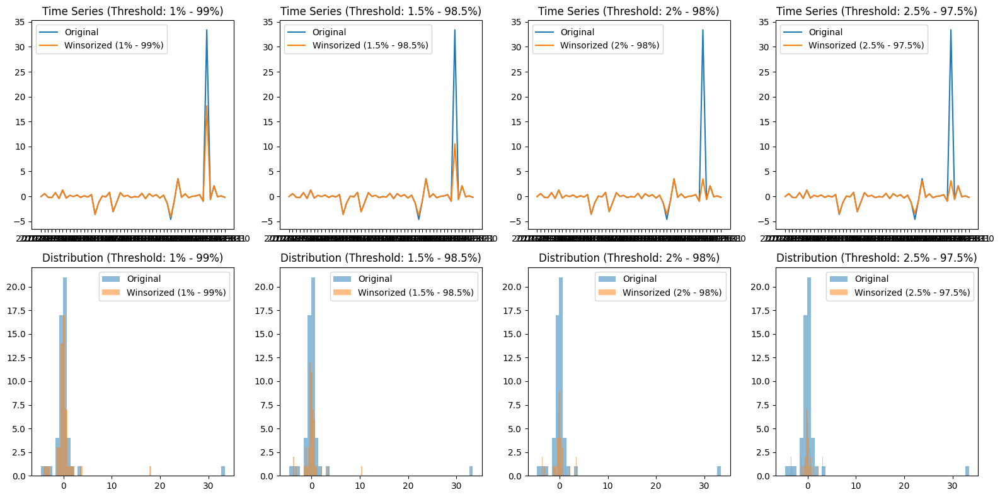

In [37]:
factor = 'interestCoverageRatio_QoQ_Growth'
lower_thresholds = [1, 1.5, 2, 2.5]
upper_thresholds = [(100-i) for i in lower_thresholds]
factor_data = duk_df[factor]
plot_factor_data(factor_data, lower_thresholds, upper_thresholds)

In [38]:
winsorize_data(factor_data, 1.5, 98.5).describe()

,interestCoverageRatio_QoQ_Growth
count,52.000000
mean,0.062496
std,1.871753
min,-3.862151
25%,-0.301269
50%,-0.046448
75%,0.316766
max,10.559195


{'whiskers': [<matplotlib.lines.Line2D at 0x7a47d32869e0>,
 'caps': [<matplotlib.lines.Line2D at 0x7a47d3286f20>,
 'boxes': [<matplotlib.lines.Line2D at 0x7a47d3286740>],
 'medians': [<matplotlib.lines.Line2D at 0x7a47d3287460>],
 'fliers': [<matplotlib.lines.Line2D at 0x7a47d3287700>],
 'means': []}

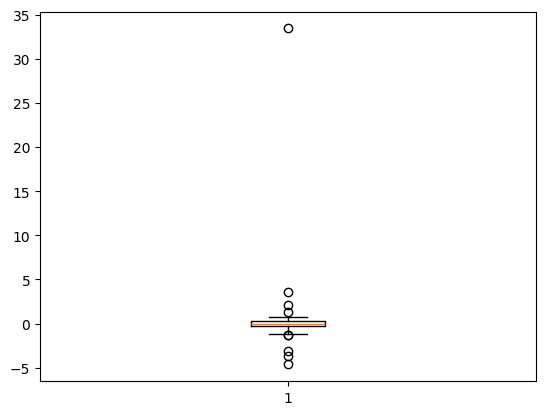

In [39]:
plt.boxplot(factor_data)

{'whiskers': [<matplotlib.lines.Line2D at 0x7a47d30fdd50>,
 'caps': [<matplotlib.lines.Line2D at 0x7a47d30fe290>,
 'boxes': [<matplotlib.lines.Line2D at 0x7a47d30fdab0>],
 'medians': [<matplotlib.lines.Line2D at 0x7a47d30fe7d0>],
 'fliers': [<matplotlib.lines.Line2D at 0x7a47d30fea70>],
 'means': []}

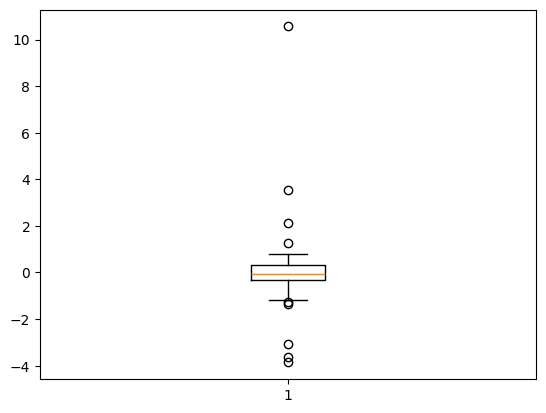

In [40]:
plt.boxplot(winsorize_data(factor_data, 1.5, 98.5))

Feels like 97.5/1.5 would be good winsorization balance between completely wiping out the outlier. Will blindly apply to the dataframe for simplicity's sake. In future research, we can look at factors more uniquely.

In [41]:
for col in duk_df.columns:
  duk_df[col] = winsorize_data(duk_df[col], 1.5, 98.5)

duk_df.head()

,netProfitMargin,debtEquityRatio,assetTurnoverRatio,currentRatio,quickRatio,cashRatio,netProfitMargin_QoQ_Growth,netProfitMargin_4Q_MA,netProfitMargin_12Q_MA,netProfitMargin_YOY,...,currentRatio_QoQ_Growth,currentRatio_YOY,quickRatio_QoQ_Growth,quickRatio_YOY,cashRatio_QoQ_Growth,cashRatio_YOY,capitalExpenditureEfficiency_QoQ_Growth,capitalExpenditureEfficiency_YOY,debtServiceCoverageRatio_QoQ_Growth,debtServiceCoverageRatio_YOY
fiscalDateEnding,,,,,,,,,,,,,,,,,,,,,
2012-03-31,0.081267,0.872991,0.059728,1.226393,0.948583,0.397263,-0.049625,0.102235,0.094713,-0.417452,...,-0.045268,-0.255470,-0.013870,-0.276772,0.279292,-0.194708,0.878756,-0.076080,-0.042553,-0.405466
2012-06-30,0.124126,0.910197,0.057208,1.244573,0.957308,0.381693,0.527385,0.102494,0.097162,0.008420,...,0.014824,-0.220617,0.009199,-0.239423,-0.039193,-0.109306,0.012912,0.102111,0.533124,0.012887
2012-09-30,0.088367,0.880295,0.094681,1.383143,0.973617,0.250058,-0.288092,0.094818,0.101851,-0.257871,...,0.111339,0.046898,0.017036,-0.026615,-0.344871,-0.260398,0.388224,-0.003367,-0.206513,-0.253450
2012-12-31,0.076383,0.913109,0.090352,1.056687,0.769669,0.248575,-0.135614,0.092536,0.098945,-0.106746,...,-0.236025,-0.177382,-0.209474,-0.199865,-0.005933,-0.199524,-0.384484,0.626077,-0.258928,-0.136838
2013-03-31,0.107494,0.942696,0.052657,1.181159,0.825736,0.205820,0.407307,0.099092,0.097584,0.322724,...,0.117795,-0.036883,0.072846,-0.129505,-0.171997,-0.481904,0.038704,-0.100994,0.721968,0.552396


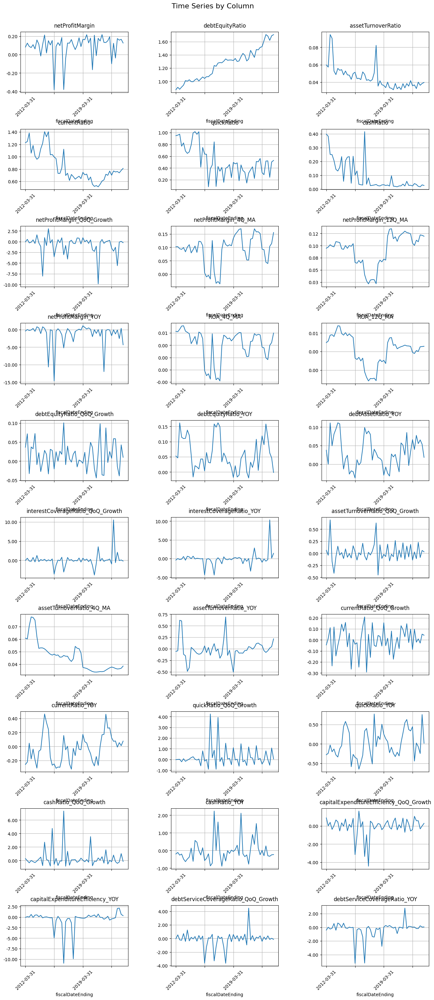

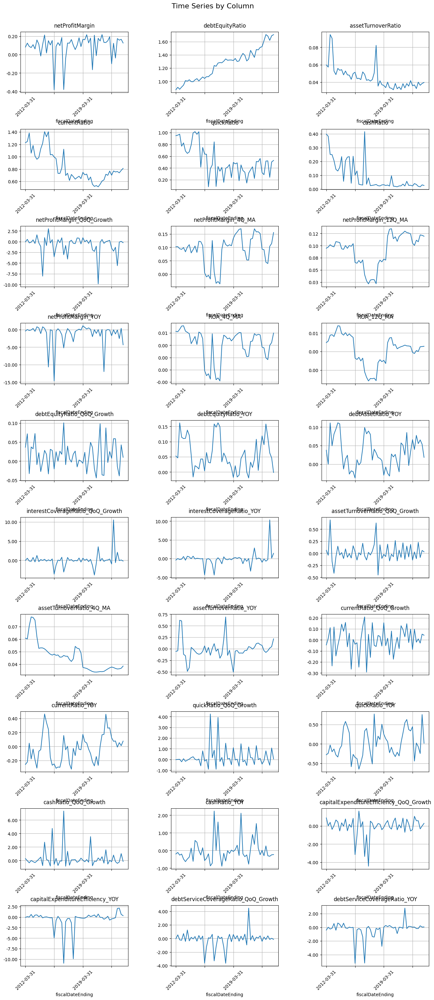

In [42]:
plot_timeseries_grid(duk_df)

In [43]:
duk_ff = duk_df.copy()
duk_ff.index = pd.to_datetime(duk_ff.index)
duk_ff.index.name = 'period'
duk_ff_daily = duk_ff.resample('D').ffill()

Let's look at the time series now that it'll be more step-like since we resampled

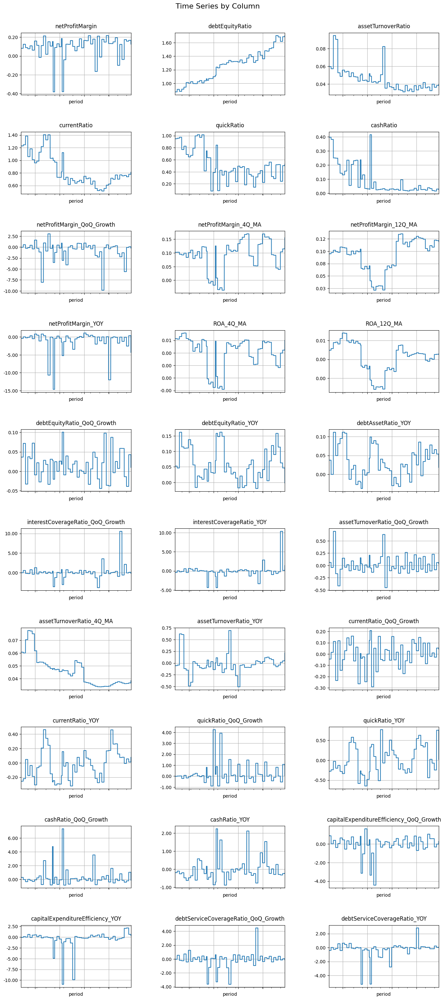

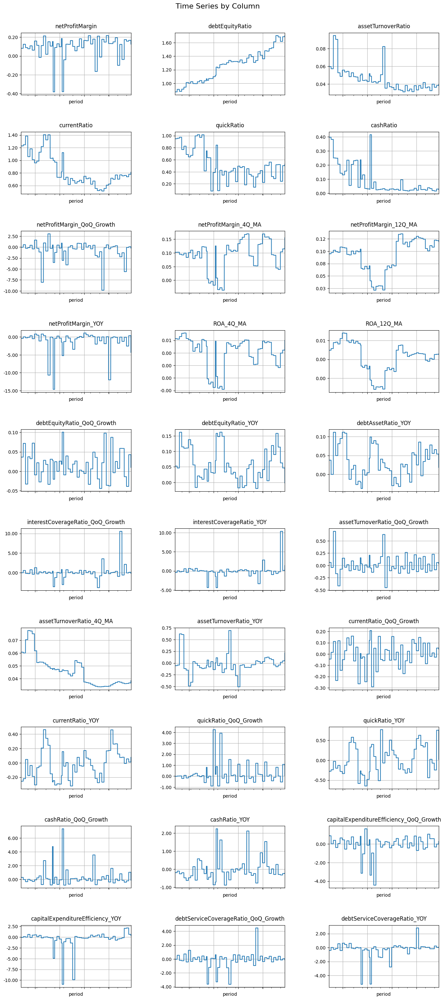

In [44]:
plot_timeseries_grid(duk_ff_daily)

In [45]:
duk_ff_daily.to_csv('/content/drive/My Drive/GitHubPortfolio/QuantDevProject/data/duk_ff_daily.csv')

## Sentiment Analysis

In [ ]:
edgar = EdgarClient(user_agent="<John Farrell> <johndfarrell@gmail.com>")

In [ ]:
duk_cik = "1326160"

In [ ]:
result = edgar.get_submissions(cik=duk_cik)

In [ ]:
result.keys()

dict_keys(['cik', 'entityType', 'sic', 'sicDescription', 'ownerOrg', 'insiderTransactionForOwnerExists', 'insiderTransactionForIssuerExists', 'name', 'tickers', 'exchanges', 'ein', 'description', 'website', 'investorWebsite', 'category', 'fiscalYearEnd', 'stateOfIncorporation', 'stateOfIncorporationDescription', 'addresses', 'phone', 'flags', 'formerNames', 'filings'])

In [ ]:
result['filings']['recent'].keys()

dict_keys(['accessionNumber', 'filingDate', 'reportDate', 'acceptanceDateTime', 'act', 'form', 'fileNumber', 'filmNumber', 'items', 'core_type', 'size', 'isXBRL', 'isInlineXBRL', 'primaryDocument', 'primaryDocDescription'])

In [ ]:
result['filings']['recent']['primaryDocument'][:20]

['xslF345X05/wk-form4_1728074221.xml',
 'xslF345X05/wk-form4_1724704179.xml',
 'xsl144X01/primary_doc.xml',
 'xsl144X01/primary_doc.xml',
 'tm2421766d4_8k.htm',
 'tm2421766-2_424b5.htm',
 'tm2421766d3_fwp.htm',
 'tm2421766-1_424b5.htm',
 'xslF345X05/wk-form4_1723494066.xml',
 'xsl144X01/primary_doc.xml',
 'duk-20240630.htm',
 'duk-20240806.htm',
 'tm2419445d1_8k.htm',
 'tm2419006d1_8k.htm',
 'xslF345X05/wk-form4_1720038153.xml',
 'rsp-2023form11xk.htm',
 'tm2415858d5_8k.htm',
 'tm2415858-3_424b5.htm',
 'tm2415858d2_fwp.htm',
 'tm2415858-1_424b5.htm']

In [ ]:
@dataclass
class Filing:
    accession_number: str
    report_date: str
    form: str
    primary_document: str

    # @property
    # def cik(self) -> str:
    #     """Extract CIK from accession number."""
    #     return self.accession_number.split('-')[0].lstrip('0')

    @property
    def accession_number_cleaned(self) -> str:
        """Remove dashes from accession number."""
        return self.accession_number.replace('-', '')

    def get_edgar_url(self) -> str:
        """
        Generate the EDGAR URL for the filing.
        Format: https://www.sec.gov/Archives/edgar/data/CIK/AccessionNumber/PrimaryDocument
        """
        return f"https://www.sec.gov/Archives/edgar/data/{duk_cik}/{self.accession_number_cleaned}/{self.primary_document}"

    def get_index_url(self) -> str:
        """
        Generate the URL for the filing's index page.
        Format: https://www.sec.gov/Archives/edgar/data/CIK/AccessionNumber/index.json
        """
        return f"https://www.sec.gov/Archives/edgar/data/{duk_cik}/{self.accession_number_cleaned}/index.json"

def filter_filings(data: dict, form_types: set = {'10-Q', '10-K'}) -> List[Filing]:
    """
    Filter SEC filings data to extract matched pairs of information for specific form types.

    Args:
        data: Dictionary containing SEC filings data
        form_types: Set of form types to filter for (default: {'10-Q', '10-K'})

    Returns:
        List of Filing objects containing matched information
    """
    recent = data['filings']['recent']

    # Get indices of forms that match our criteria
    matching_indices = [
        i for i, form in enumerate(recent['form'])
        if form in form_types
    ]

    # Create Filing objects for matched entries
    filtered_filings = [
        Filing(
            accession_number=recent['accessionNumber'][i],
            report_date=recent['reportDate'][i],
            form=recent['form'][i],
            primary_document=recent['primaryDocument'][i]
        )
        for i in matching_indices
    ]

    return filtered_filings


In [ ]:
# Filter the filings
filtered = filter_filings(result)

In [ ]:
filtered[:4]

[Filing(accession_number='0001326160-24-000167', report_date='2024-06-30', form='10-Q', primary_document='duk-20240630.htm'),
 Filing(accession_number='0001326160-24-000108', report_date='2024-03-31', form='10-Q', primary_document='duk-20240331.htm'),
 Filing(accession_number='0001326160-24-000037', report_date='2023-12-31', form='10-K', primary_document='duk-20231231.htm'),
 Filing(accession_number='0001326160-23-000191', report_date='2023-09-30', form='10-Q', primary_document='duk-20230930.htm'),
 Filing(accession_number='0001326160-23-000172', report_date='2023-06-30', form='10-Q', primary_document='duk-20230630.htm'),
 Filing(accession_number='0001326160-23-000148', report_date='2023-03-31', form='10-Q', primary_document='duk-20230331.htm'),
 Filing(accession_number='0001326160-23-000073', report_date='2022-12-31', form='10-K', primary_document='duk-20221231.htm'),
 Filing(accession_number='0001326160-22-000279', report_date='2022-09-30', form='10-Q', primary_document='duk-20220930

In [ ]:
class EDGARExtractor:
    # Exact section markers
    SECTION_PATTERNS = {
        '10-K': {
            'start': r"(?:\*\*\s*)?ITEM\s*7\.?\s*(?:MANAGEMENT[’']S|MANAGEMENT'S)\s+DISCUSSION\s+AND\s+ANALYSIS\s+OF\s+FINANCIAL\s+CONDITION\s+AND\s+RESULTS\s+OF\s+OPERATIONS\s*(?:\*\*)?(?!\s*\")",
            'end': r"(?:\*\*\s*)?ITEM\s*7A\.?\s*QUANTITATIVE\s+AND\s+QUALITATIVE\s+DISCLOSURES\s+ABOUT\s+MARKET\s+RISK\s*(?:\*\*)?(?!\s*\")"
        },
        '10-Q': {
            'start': r"(?:\*\*\s*)?ITEM\s*2\.?\s*(?:MANAGEMENT[’']S|MANAGEMENT'S)\s+DISCUSSION\s+AND\s+ANALYSIS\s+OF\s+(?:RESULTS\s+OF\s+OPERATIONS\s+AND\s+FINANCIAL\s+CONDITION|FINANCIAL\s+CONDITION\s+AND\s+RESULTS\s+OF\s+OPERATIONS)\s*(?:\*\*)?(?!\s*\")",
            'end': r"(?:\*\*\s*)?ITEM\s*3\.?\s*QUANTITATIVE\s+AND\s+QUALITATIVE\s+DISCLOSURES\s+ABOUT\s+MARKET\s+RISK\s*(?:\*\*)?(?!\s*\")"
        }
    }

    def __init__(self, user_agent: str):
        """
        Initialize the EDGAR extractor.

        Args:
            user_agent: Your user agent string for SEC EDGAR requests
                       Format: "Your Name your.email@domain.com"
        """
        self.headers = {
            'User-Agent': user_agent,
            'Accept-Encoding': 'gzip, deflate',
            'Host': 'www.sec.gov'
        }

    def get_filing_content(self, filing: Filing) -> Optional[str]:
        """Fetch the content of a filing from EDGAR."""
        try:
            sleep(0.1)  # Respect SEC's rate limiting
            response = requests.get(
                filing.get_edgar_url(),
                headers=self.headers,
                timeout=10
            )
            response.raise_for_status()
            return response.text
        except Exception as e:
            print(f"Error fetching {filing.get_edgar_url()}: {str(e)}")
            return None

    def find_section_indices(self, text: str, form_type: str) -> Optional[Tuple[int, int]]:
        """Find the start and end indices of the MD&A section, using the second occurrence for 10-Q forms."""
        patterns = self.SECTION_PATTERNS.get(form_type)
        if not patterns:
            return None

        # Find all occurrences of start and end markers
        text = re.sub(r'[\xa0\t]+', ' ', text)
        start_matches = list(re.finditer(patterns['start'], text, re.IGNORECASE))
        end_matches = list(re.finditer(patterns['end'], text, re.IGNORECASE))

        if not start_matches:
            print(f"Could not find start pattern: {patterns['start']}")
            return None
        if not end_matches:
            print(f"Could not find end pattern: {patterns['end']}")
            return None

        # Try to use the second occurrence for 10-Q, fallback to the first if not available
        if form_type == '10-Q':
            if len(start_matches) >= 2:
                start_idx = start_matches[1].start()  # Use the second occurrence if available
            else:
                print("Only one start pattern found, using the first occurrence")
                start_idx = start_matches[0].start()  # Fallback to first if second isn't available
        else:
            # For 10-K, we use the first occurrence
            start_idx = start_matches[0].start()

        # Now find the end marker, fallback to first occurrence if second isn't found
        if form_type == '10-Q':
            # Filter end matches that occur after the start index
            filtered_end_matches = [match for match in end_matches if match.start() > start_idx]
            if len(filtered_end_matches) > 0:
                end_idx = filtered_end_matches[0].start()  # Use the first end match after the start
            else:
                print("Could not find a valid end pattern after the start")
                return None
        else:
            # For 10-K, find the first end marker that comes after the start marker
            end_idx = None
            for match in end_matches:
                if match.start() > start_idx:
                    end_idx = match.start()
                    break

        if end_idx is None:
            print("Found start but no matching end marker")
            return None

        return (start_idx, end_idx)

    def extract_mda_section(self, html_content: str, form_type: str) -> Optional[str]:
        """Extract MD&A section from the filing."""
        if not html_content:
            return None

        # Convert HTML to plain text
        soup = BeautifulSoup(html_content, 'html.parser')

        # Remove script and style elements
        for element in soup(['script', 'style']):
            element.decompose()

        # Get text content
        text = ' '.join(soup.stripped_strings)

        # Find section boundaries
        indices = self.find_section_indices(text, form_type)
        if not indices:
            return None

        # Extract and clean the section
        section_text = text[indices[0]:indices[1]].strip()

        # Clean up whitespace
        section_text = re.sub(r'\s+', ' ', section_text)

        return section_text

In [ ]:
def create_mda_df(filings: List[Filing], user_agent: str) -> pd.DataFrame:
    """
    Create a DataFrame containing MD&A sections from the filings.

    Args:
        filings: List of Filing objects
        user_agent: User agent string for SEC EDGAR requests

    Returns:
        DataFrame with columns: Date, Form, Text
    """
    extractor = EDGARExtractor(user_agent)
    data = []

    for filing in filings:
        print(f"Processing {filing.form} from {filing.report_date}...")
        content = extractor.get_filing_content(filing)
        if content:
            section_text = extractor.extract_mda_section(content, filing.form)
            if section_text:
                print("\nExample text snippet from first filing:")
                print(section_text[:200] + "...")
                data.append({
                    'Date': filing.report_date,
                    'Form': filing.form,
                    'Text': section_text
                })
            else:
                print(f"Could not find MD&A section in {filing.form} from {filing.report_date}")

    return pd.DataFrame(data)

In [ ]:
user_agent = "John Farrell johndfarrell@gmail.com"
text_df = create_mda_df(filtered, user_agent)

Processing 10-Q from 2024-06-30...

Example text snippet from first filing:
E ENERGY ITEM 2. MANAGEMENT’S DISCUSSION AND ANALYSIS OF FINANCIAL CONDITION AND RESULTS OF OPERATIONS The following combined Management’s Discussion and Analysis of Financial Condition and Results of...
Processing 10-Q from 2024-03-31...

Example text snippet from first filing:
E ENERGY ITEM 2. MANAGEMENT’S DISCUSSION AND ANALYSIS OF FINANCIAL CONDITION AND RESULTS OF OPERATIONS The following combined Management’s Discussion and Analysis of Financial Condition and Results of...
Processing 10-K from 2023-12-31...

Example text snippet from first filing:
e Energy Registrants. 39 MD&A DUKE ENERGY ITEM 7. MANAGEMENT’S DISCUSSION AND ANALYSIS OF FINANCIAL CONDITION AND RESULTS OF OPERATIONS Management’s Discussion and Analysis includes financial informat...
Processing 10-Q from 2023-09-30...

Example text snippet from first filing:
E ENERGY ITEM 2. MANAGEMENT’S DISCUSSION AND ANALYSIS OF FINANCIAL CONDITION AND RES

In [ ]:
text_df.Text[0][:500]

'Item 7. Management’s Discussion and Analysis of Financial Condition and Results of Operations. INTRODUCTION Management’s Discussion and Analysis should be read in conjunction with the Consolidated Financial Statements and Notes for the years ended December 31, 2006, 2005 and 2004. EXECUTIVE OVERVIEW 2006 Objectives. Duke Energy’s objectives for 2006, as outlined in the 2006 Charter, consisted of the following: • Establish an industry-leading electric power platform through successful execution o'

In [ ]:
text_df.Text[0][-500:]

'ich financial statements have not been issued. There were no modifications to, or exchanges of, any of Duke Energy’s debt instruments within the scope of EITF No. 06-6 in 2006. EITF No. 06-6 is effective for Duke Energy beginning January 1, 2007. The impact to Duke Energy of applying EITF No. 06-6 in subsequent periods will be dependent upon the nature of any modifications to, or exchanges of, any debt instruments within the scope of EITF No. 06-6. Refer to Note 15, “Debt and Credit Facilities.”'

In [ ]:
len(text_df.Text[0])

228580

In [ ]:
text_df

,Date,Form,Text
0,2024-06-30,10-Q,E ENERGY ITEM 2. MANAGEMENT’S DISCUSSION AND A...
1,2024-03-31,10-Q,E ENERGY ITEM 2. MANAGEMENT’S DISCUSSION AND A...
2,2023-12-31,10-K,e Energy Registrants. 39 MD&A DUKE ENERGY ITEM...
3,2023-09-30,10-Q,E ENERGY ITEM 2. MANAGEMENT’S DISCUSSION AND A...
4,2023-06-30,10-Q,E ENERGY ITEM 2. MANAGEMENT’S DISCUSSION AND A...
...,...,...,...
67,2007-06-30,10-Q,I Item 2. Management’s Discussion and Analysis...
68,2007-03-31,10-Q,I Item 2. Management’s Discussion and Analysis...
69,2006-12-31,10-K,Item 7. Management’s Discussion and Analysis o...
70,2006-06-30,10-Q,Item 2. Management’s Discussion and Analysis o...


In [ ]:
text_df_copy = text_df.copy()

In [ ]:
text_df_copy.set_index('Date', inplace=True)
text_df_copy.sort_index(ascending=True, inplace=True)
text_df_copy.head()

,Form,Text
Date,,
2006-03-31,10-Q,art I Item 2. Management’s Discussion and Anal...
2006-06-30,10-Q,Item 2. Management’s Discussion and Analysis o...
2006-12-31,10-K,Item 7. Management’s Discussion and Analysis o...
2007-03-31,10-Q,I Item 2. Management’s Discussion and Analysis...
2007-06-30,10-Q,I Item 2. Management’s Discussion and Analysis...


In [ ]:
text_df_copy.to_feather('/content/drive/My Drive/GitHubPortfolio/QuantDevProject/data/text_df.ftr')

In [ ]:
def analyze_sentiment_finbert(text):
    tokenizer = AutoTokenizer.from_pretrained("ProsusAI/finbert")
    model = AutoModelForSequenceClassification.from_pretrained("ProsusAI/finbert")

    inputs = tokenizer(text, return_tensors="pt", truncation=True, padding=True, max_length=512)
    outputs = model(**inputs)

    probabilities = torch.nn.functional.softmax(outputs.logits, dim=-1)
    positive_prob = probabilities[0][2].item()
    negative_prob = probabilities[0][0].item()

    return positive_prob - negative_prob  # Returns a score between -1 and 1

In [ ]:
for date in text_df_copy.index:
  extracted_text = text_df_copy.loc[date, 'Text']
  cleaned_text = re.sub(r"\n|&#[0-9]+;", "", extracted_text)
  sentiment_score = analyze_sentiment_finbert(cleaned_text)
  text_df_copy.loc[date, 'sentiment_score'] = sentiment_score

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/252 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/758 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


pytorch_model.bin:   0%|          | 0.00/438M [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in tra

In [ ]:
text_df_copy.head()

,Form,Text,sentiment_score
Date,,,
2006-03-31,10-Q,art I Item 2. Management’s Discussion and Anal...,0.639821
2006-06-30,10-Q,Item 2. Management’s Discussion and Analysis o...,0.683942
2006-12-31,10-K,Item 7. Management’s Discussion and Analysis o...,-0.593365
2007-03-31,10-Q,I Item 2. Management’s Discussion and Analysis...,0.047753
2007-06-30,10-Q,I Item 2. Management’s Discussion and Analysis...,0.017703


In [ ]:
sentiments = text_df_copy[['sentiment_score']]

In [ ]:
sentiments.to_feather('/content/drive/My Drive/GitHubPortfolio/QuantDevProject/data/sentiments.ftr')

In [46]:
# get sentiments
sentiments = pd.read_feather('/content/drive/My Drive/GitHubPortfolio/QuantDevProject/data/sentiments.ftr')
sentiments.index.name='period'
sentiments.index = pd.to_datetime(sentiments.index)
sentiments_daily = sentiments.resample('D').ffill().bfill()

## Will weather have some impact?

#### Let's grab weather data from the predominant areas of operation for Duke (Carolinas, Florida, Ohio, Indiana, Kentucky).
  Given that the majority of their business is in the Carolinas, we'll weight the metrics 4:2:1 (Carolinas:Florida:Ohio). This is arbitrary, but I could perform some further analysis at some point to figure out a better weighting scheme based on further data. I'm only going to consider Ohio out of the Midwest states to simplify the weather weighting scheme and not add further weight to that region.

In [47]:
# params
frequency="daily"
start_date="1986-01-01"
end_date="2024-10-21"
weather_metrics = ["temperature_2m_max", "temperature_2m_min", "temperature_2m_mean", "sunshine_duration", "precipitation_sum", "rain_sum", "snowfall_sum", "wind_speed_10m_max"]
weather_metrics_str = ",".join(weather_metrics)

In [48]:
def get_open_meteo_data(latitude, longitude, start_date, end_date, frequency, metrics):
  # Setup the Open-Meteo API client with cache and retry on error
  cache_session = requests_cache.CachedSession('.cache', expire_after = -1)
  retry_session = retry(cache_session, retries = 5, backoff_factor = 0.2)
  openmeteo = openmeteo_requests.Client(session = retry_session)

  # Make sure all required weather variables are listed here
  # The order of variables in hourly or daily is important to assign them correctly below
  url = "https://archive-api.open-meteo.com/v1/archive"
  params = {
    "latitude": latitude,
    "longitude": longitude,
    "start_date": start_date,
    "end_date": end_date,
    "daily": metrics,
    "timezone": "America/New_York"
  }
  try:
    response = openmeteo.weather_api(url, params=params)

    return response
  except requests.exceptions.RequestException as e:
    print(f"Error fetching data: {e}")
    return None

def open_meteo_postprocessing(response):
  # Process first location. Add a for-loop for multiple locations or weather models
  response = response[0]
  print(f"Coordinates {response.Latitude()}°N {response.Longitude()}°E")
  print(f"Elevation {response.Elevation()} m asl")
  print(f"Timezone {response.Timezone()} {response.TimezoneAbbreviation()}")
  print(f"Timezone difference to GMT+0 {response.UtcOffsetSeconds()} s")
  print("\n")

  # Process daily data. The order of variables needs to be the same as requested.
  daily = response.Daily()
  daily_temperature_2m_max = daily.Variables(0).ValuesAsNumpy()
  daily_temperature_2m_min = daily.Variables(1).ValuesAsNumpy()
  daily_temperature_2m_mean = daily.Variables(2).ValuesAsNumpy()
  daily_sunshine_duration = daily.Variables(3).ValuesAsNumpy()
  daily_precipitation_sum = daily.Variables(4).ValuesAsNumpy()
  daily_rain_sum = daily.Variables(5).ValuesAsNumpy()
  daily_snowfall_sum = daily.Variables(6).ValuesAsNumpy()
  daily_wind_speed_10m_max = daily.Variables(7).ValuesAsNumpy()

  daily_data = {"date": pd.date_range(
    start = pd.to_datetime(daily.Time(), unit = "s", utc = True),
    end = pd.to_datetime(daily.TimeEnd(), unit = "s", utc = True),
    freq = pd.Timedelta(seconds = daily.Interval()),
    inclusive = "left"
  )}
  daily_data["temperature_2m_max"] = daily_temperature_2m_max
  daily_data["temperature_2m_min"] = daily_temperature_2m_min
  daily_data["temperature_2m_mean"] = daily_temperature_2m_mean
  daily_data["sunshine_duration"] = daily_sunshine_duration
  daily_data["precipitation_sum"] = daily_precipitation_sum
  daily_data["rain_sum"] = daily_rain_sum
  daily_data["snowfall_sum"] = daily_snowfall_sum
  daily_data["wind_speed_10m_max"] = daily_wind_speed_10m_max

  daily_dataframe = pd.DataFrame(data = daily_data)
  # daily_dataframe['date'] = pd.to_datetime(daily_dataframe['date'])
  daily_dataframe = (daily_dataframe
                    .rename(columns={'date': 'period'})
                    .set_index('period'))

  return daily_dataframe

In [49]:
# Charlotte, NC coordinates
char_lat = 35.2271
char_lon = -80.9379

# Orlando, FL coordinates
orl_lat = 28.5383
orl_lon = -81.3792

# Columbus, OH coordinates
col_lat = 39.9612
col_lon = -82.9988

coordinates = [(char_lat, char_lon), (orl_lat, orl_lon), (col_lat, col_lon)]

weights = [(4/7), (2/7), (1/7)]

In [50]:
def weighted_avg_dataframes(dfs, weights):
    """
    Compute the weighted average of multiple DataFrames dynamically with input validation.

    Parameters:
    dfs (list of pd.DataFrame): List of DataFrames to average.
    weights (list of float): List of weights corresponding to each DataFrame. Weights should sum to 1 and be between 0 and 1.

    Returns:
    pd.DataFrame: A DataFrame with the weighted average of the input DataFrames.

    Raises:
    ValueError: If weights don't sum to 1, contain values outside [0, 1], or lengths of dfs and weights don't match.
    """
    # Ensure the lengths of dfs and weights match
    assert len(dfs) == len(weights), "The number of DataFrames must match the number of weights."

    # Ensure all weights are between 0 and 1
    assert all(0 <= w <= 1 for w in weights), "All weights must be between 0 and 1."

    # Ensure weights sum to 1, allowing for a small tolerance due to floating-point precision
    assert abs(sum(weights) - 1) < 1e-6, "Weights must sum to 1."

    # Initialize the weighted sum with the first DataFrame multiplied by its weight
    weighted_sum = dfs[0].copy()
    weighted_sum *= weights[0]

    # Iterate over the remaining DataFrames and add them to the weighted sum
    for i in range(1, len(dfs)):
        weighted_sum += dfs[i] * weights[i]

    return weighted_sum

In [52]:
weather_dfs = []
for lat, lon in coordinates:
  time.sleep(5)
  weather_response = get_open_meteo_data(lat, lon, start_date, end_date, frequency, weather_metrics_str)
  weather_df = open_meteo_postprocessing(weather_response)
  weather_dfs.append(weather_df)

Coordinates 35.25483322143555°N -80.9195556640625°E
Elevation 226.0 m asl
Timezone b'America/New_York' b'EST'
Timezone difference to GMT+0 -18000 s


Coordinates 28.506149291992188°N -81.39932250976562°E
Elevation 35.0 m asl
Timezone b'America/New_York' b'EST'
Timezone difference to GMT+0 -18000 s


Coordinates 39.964847564697266°N -82.96087646484375°E
Elevation 227.0 m asl
Timezone b'America/New_York' b'EST'
Timezone difference to GMT+0 -18000 s




In [53]:
avg_weather_df = weighted_avg_dataframes(weather_dfs, weights)

In [54]:
avg_weather_df

,temperature_2m_max,temperature_2m_min,temperature_2m_mean,sunshine_duration,precipitation_sum,rain_sum,snowfall_sum,wind_speed_10m_max
period,,,,,,,,
1986-01-01 05:00:00+00:00,10.849500,2.220929,6.292356,24542.521484,2.828572,2.828572,0.00,13.070715
1986-01-02 05:00:00+00:00,13.413787,2.820929,7.916465,27489.142578,0.071429,0.071429,0.00,11.024405
1986-01-03 05:00:00+00:00,15.913786,5.292357,10.582535,26156.117188,0.442857,0.442857,0.00,16.659056
1986-01-04 05:00:00+00:00,13.020929,4.392358,8.477476,9823.095703,0.157143,0.157143,0.00,14.434328
1986-01-05 05:00:00+00:00,9.263786,0.306643,5.973607,25781.548828,0.657143,0.614286,0.06,23.301260
...,...,...,...,...,...,...,...,...
2024-10-17 05:00:00+00:00,17.241716,7.406000,11.559870,37223.808594,0.000000,0.000000,0.00,15.847361
2024-10-18 05:00:00+00:00,20.520287,8.613143,14.335464,36961.574219,0.000000,0.000000,0.00,15.111421
2024-10-19 05:00:00+00:00,22.148859,10.463143,15.700048,35913.503906,0.000000,0.000000,0.00,15.249150


Let's look to see if there are also some major outliers in this dataset

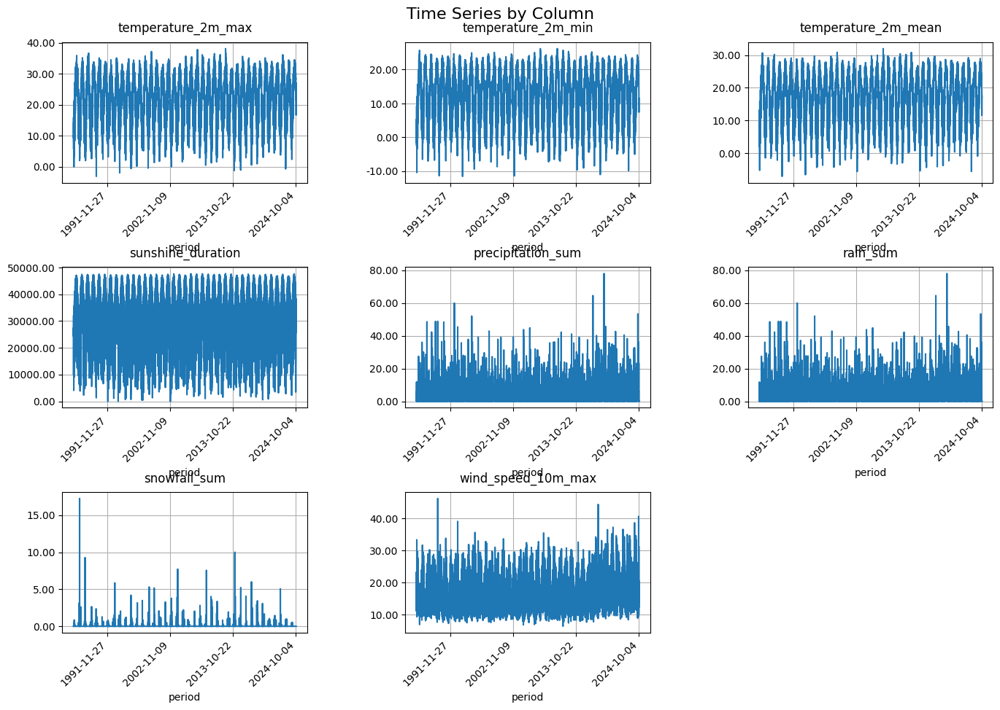

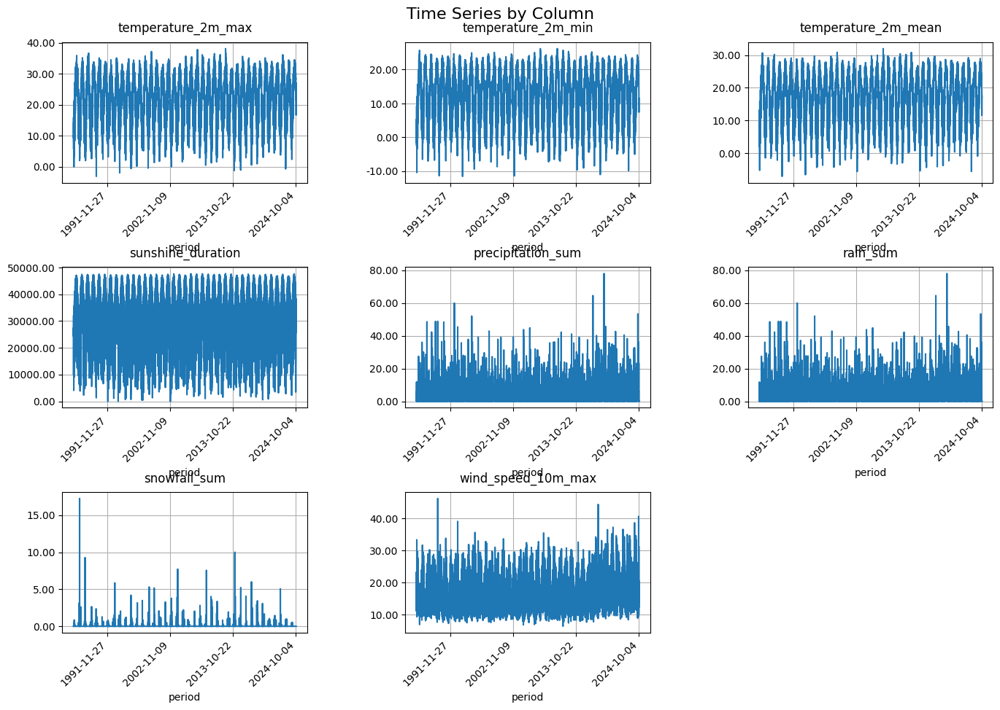

In [55]:
plot_timeseries_grid(avg_weather_df)

Not clear... let's look at distributions

In [56]:
def plot_distributions(df, figsize=(15, 10)):
    """
    Create a grid of distribution plots for each column in a pandas DataFrame.

    Parameters:
    df (pandas.DataFrame): Input DataFrame
    figsize (tuple): Figure size as (width, height)

    Returns:
    matplotlib.figure.Figure: The created figure
    """
    # Calculate grid dimensions
    n_cols = len(df.columns)
    n_rows = math.ceil(n_cols / 3)  # 3 plots per row
    n_cols_plot = min(3, n_cols)

    # Create figure and subplots
    fig, axes = plt.subplots(n_rows, n_cols_plot, figsize=figsize)

    # Flatten axes array for easier iteration
    if n_rows == 1 and n_cols_plot == 1:
        axes = [axes]
    elif n_rows == 1 or n_cols_plot == 1:
        axes = axes.flatten()
    else:
        axes = axes.flatten()

    # Create distribution plot for each column
    for idx, column in enumerate(df.columns):
        if idx < len(axes):  # Ensure we don't exceed number of subplots
            # Check if column is numeric
            if pd.api.types.is_numeric_dtype(df[column]):
                # Create distribution plot
                sns.histplot(data=df, x=column, kde=True, ax=axes[idx])
                axes[idx].set_title(f'Distribution of {column}')
            else:
                # For non-numeric columns, create a count plot
                sns.countplot(data=df, x=column, ax=axes[idx])
                axes[idx].set_title(f'Count plot of {column}')
                axes[idx].tick_params(axis='x', rotation=45)

    # Remove empty subplots if any
    for idx in range(len(df.columns), len(axes)):
        fig.delaxes(axes[idx])

    # Adjust layout to prevent overlap
    plt.tight_layout()
    return fig

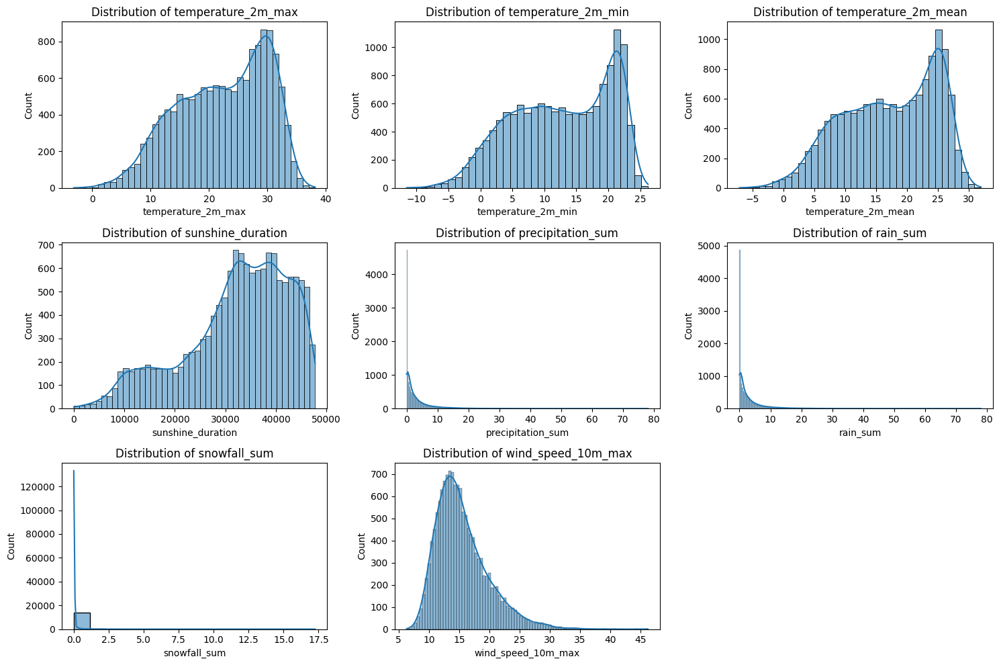

In [57]:
fig = plot_distributions(avg_weather_df)
plt.show()

One thing that jumps out immediately is that we don't need max, min, and mean temperatures. Further, precipitation and rain sums look identical. We'll drop max and min temps and precip sum. Just confirm with corr matrix first.

In [58]:
# confirm with corr matrix
avg_weather_df.corr()

,temperature_2m_max,temperature_2m_min,temperature_2m_mean,sunshine_duration,precipitation_sum,rain_sum,snowfall_sum,wind_speed_10m_max
temperature_2m_max,1.000000,0.950953,0.987803,0.551017,0.043459,0.060149,-0.189695,-0.291499
temperature_2m_min,0.950953,1.000000,0.985062,0.388253,0.166380,0.182023,-0.163095,-0.265635
temperature_2m_mean,0.987803,0.985062,1.000000,0.480187,0.102064,0.118315,-0.177725,-0.275073
sunshine_duration,0.551017,0.388253,0.480187,1.000000,-0.438419,-0.427437,-0.176994,-0.277708
precipitation_sum,0.043459,0.166380,0.102064,-0.438419,1.000000,0.996114,0.158620,0.275968
rain_sum,0.060149,0.182023,0.118315,-0.427437,0.996114,1.000000,0.071091,0.266818
snowfall_sum,-0.189695,-0.163095,-0.177725,-0.176994,0.158620,0.071091,1.000000,0.138309
wind_speed_10m_max,-0.291499,-0.265635,-0.275073,-0.277708,0.275968,0.266818,0.138309,1.000000


In [61]:
avg_weather_df.drop(['temperature_2m_max', 'temperature_2m_min', 'precipitation_sum'], axis=1, inplace=True)

Let's look at snowfall_sum and rain_sum in more detail. They might have funky outliers we'll have to handle

In [62]:
avg_weather_df.describe()

,temperature_2m_mean,sunshine_duration,rain_sum,snowfall_sum,wind_speed_10m_max
count,14174.000000,14174.000000,14174.000000,14174.000000,14174.000000
mean,17.197147,32324.673828,2.897506,0.036858,15.515166
std,7.506736,10262.419922,4.891610,0.307443,4.307417
min,-7.075500,0.000000,0.000000,0.000000,6.322319
25%,11.210438,26853.593262,0.071429,0.000000,12.453089
50%,17.919888,33939.314453,1.071429,0.000000,14.689375
75%,24.012884,40181.998047,3.557143,0.000000,17.748850
max,31.989681,47758.957031,78.042854,17.260000,46.247498


In [72]:
def create_boxplot_grid(df, figsize=(15, 10)):
    """
    Create a grid of box plots for each numeric column in the DataFrame.

    Parameters:
    df (pandas.DataFrame): Input DataFrame
    figsize (tuple): Figure size as (width, height)

    Returns:
    matplotlib.figure.Figure: The created figure
    """
    # Select only numeric columns
    numeric_cols = df.select_dtypes(include=['int64', 'float32']).columns
    n_cols = len(numeric_cols)

    # Calculate grid dimensions
    n_rows = math.ceil(n_cols / 3)  # 3 plots per row
    n_cols_plot = min(n_cols, 3)

    # Create figure and subplots
    fig, axes = plt.subplots(n_rows, n_cols_plot, figsize=figsize)

    # Flatten axes array for easier iteration
    if n_rows == 1 and n_cols_plot == 1:
        axes = np.array([axes])
    axes = axes.flatten()

    # Create box plots
    for idx, col in enumerate(numeric_cols):
        sns.boxplot(data=df, y=col, ax=axes[idx])
        axes[idx].set_title(f'Distribution of {col}')
        axes[idx].set_ylabel(col)

    # Remove empty subplots if any
    for idx in range(len(numeric_cols), len(axes)):
        fig.delaxes(axes[idx])

    # Adjust layout
    plt.tight_layout()
    return fig

In [73]:
avg_weather_df

,temperature_2m_mean,sunshine_duration,rain_sum,snowfall_sum,wind_speed_10m_max
period,,,,,
1986-01-01,6.292356,24542.521484,2.828572,0.00,13.070715
1986-01-02,7.916465,27489.142578,0.071429,0.00,11.024405
1986-01-03,10.582535,26156.117188,0.442857,0.00,16.659056
1986-01-04,8.477476,9823.095703,0.157143,0.00,14.434328
1986-01-05,5.973607,25781.548828,0.614286,0.06,23.301260
...,...,...,...,...,...
2024-10-17,11.559870,37223.808594,0.000000,0.00,15.847361
2024-10-18,14.335464,36961.574219,0.000000,0.00,15.111421
2024-10-19,15.700048,35913.503906,0.000000,0.00,15.249150


In [ ]:
avg_weather_df.index = avg_weather_df.index.strftime('%Y-%m-%d')

In [75]:
avg_weather_df.dtypes

,0
temperature_2m_mean,float32
sunshine_duration,float32
rain_sum,float32
snowfall_sum,float32
wind_speed_10m_max,float32


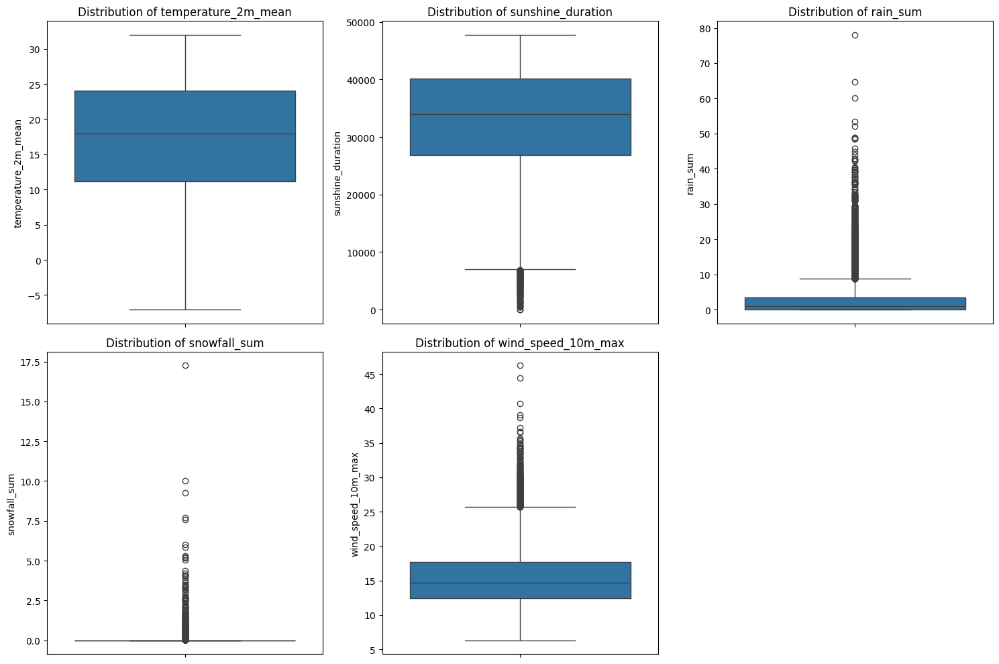

In [76]:
fig = create_boxplot_grid(avg_weather_df)
plt.show()

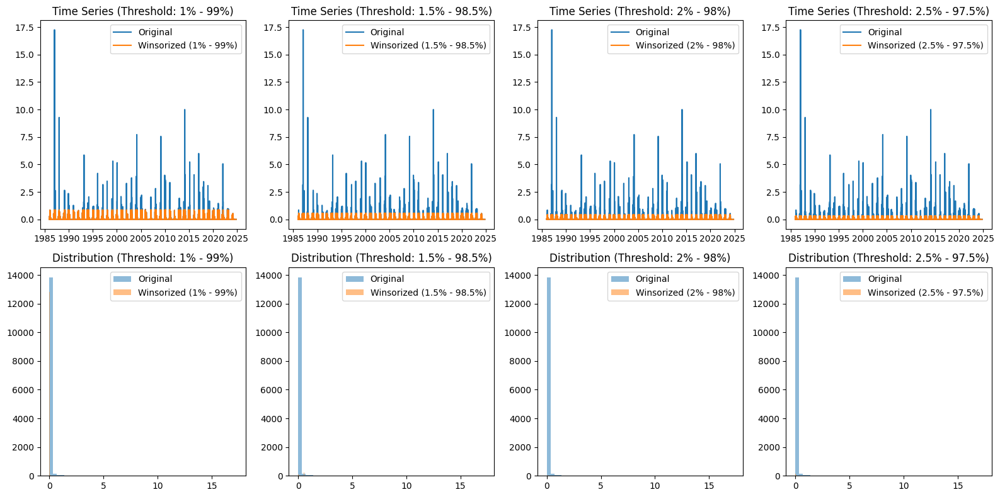

In [60]:
factor = 'snowfall_sum'
lower_thresholds = [1, 1.5, 2, 2.5]
upper_thresholds = [(100-i) for i in lower_thresholds]
factor_data = avg_weather_df[factor]
plot_factor_data(factor_data, lower_thresholds, upper_thresholds)

In [83]:
# Function to plot distributions and data
def plot_distribution_and_series(ax_distribution, ax_series, series, title):
    sns.histplot(series, kde=True, ax=ax_distribution)
    ax_distribution.set_title(f'Distribution of {title}')

    series.plot(ax=ax_series, color='b')
    ax_series.set_title(f'{title} Time Series')
    ax_series.set_xlabel('Date')
    ax_series.set_ylabel('Value')

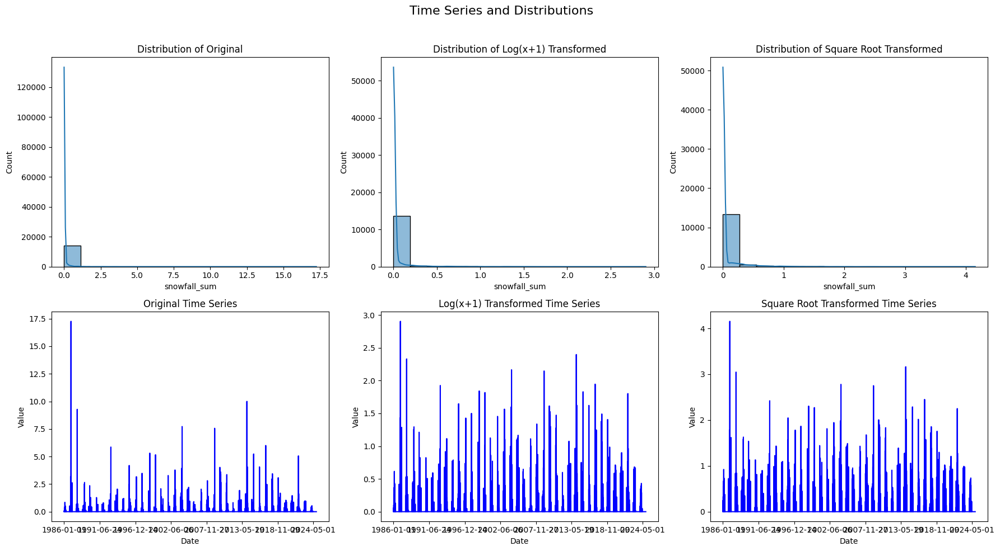

In [84]:
# Set up the grid for plotting
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
fig.suptitle('Time Series and Distributions', fontsize=16)

# Plot the original time series
plot_distribution_and_series(axes[0, 0], axes[1, 0], avg_weather_df['snowfall_sum'], 'Original')

# Plot the log-transformed time series
plot_distribution_and_series(axes[0, 1], axes[1, 1], np.log1p(avg_weather_df['snowfall_sum']), 'Log(x+1) Transformed')

# Plot the square root-transformed time series
plot_distribution_and_series(axes[0, 2], axes[1, 2], np.sqrt(avg_weather_df['snowfall_sum']), 'Square Root Transformed')

plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout to fit the suptitle
plt.show()

Looks like it might be wise to log transform the snowfall_sum and rain_sum...

In [85]:
avg_weather_df['snowfall_sum'] = np.log1p(avg_weather_df['snowfall_sum'])
avg_weather_df['rain_sum'] = np.log1p(avg_weather_df['rain_sum'])

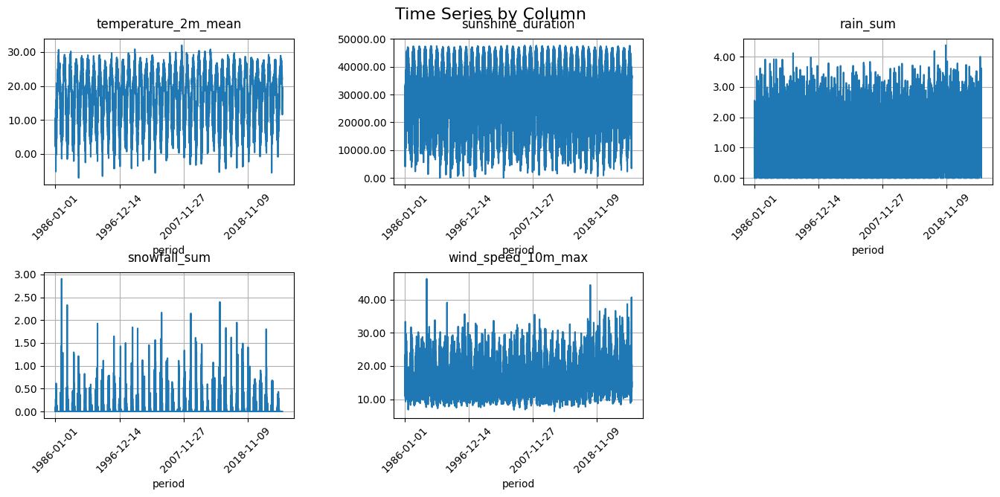

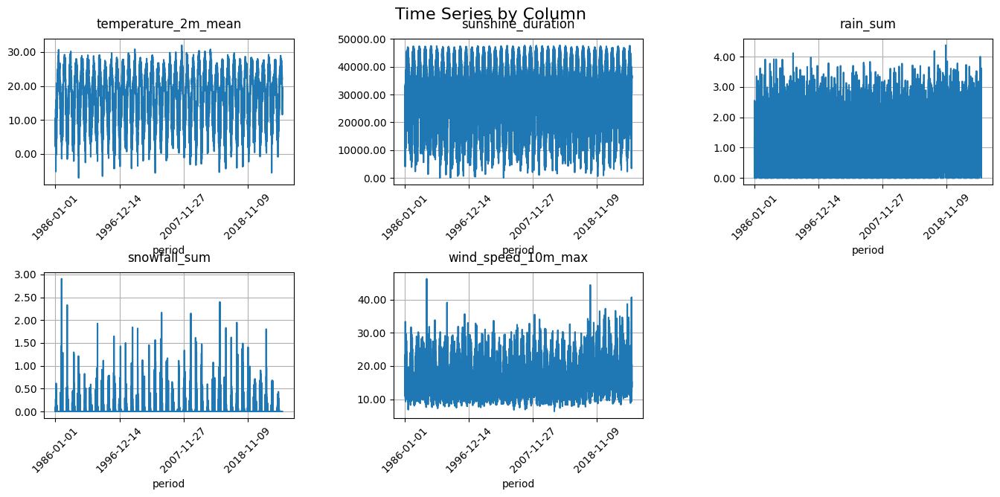

In [87]:
plot_timeseries_grid(avg_weather_df)

## EIA Data

In [88]:
home_dir = '/content/drive/My Drive/GitHubPortfolio/Electricity/'
with open('/content/drive/My Drive/GitHubPortfolio/Electricity/eia_api_key.txt', 'r') as f:
  EIA_KEY = f.readline().strip()

In [89]:
def create_eia_df(**kwargs):
  root = kwargs.get('root')
  frequency = kwargs.get('frequency')
  data_col = kwargs.get('data_col')

  # Optionals
  sort = kwargs.get('sort', 'desc')
  sort_direction = kwargs.get('sort_direction', 'period')
  offset = kwargs.get('offset', 0)  # Default to 0
  length = kwargs.get('length', 5000)  # Default to 5000
  facets = kwargs.get('facets') # (series_name, facet)

  master_df = pd.DataFrame()
  data_length = 1
  offset = 0
  while data_length > 0:
    url_prefix = f'{root}?api_key={EIA_KEY}&frequency={frequency}&data[0]={data_col}'
    if facets:
      for facet in facets:
        url_prefix += f'&facets[{facet[0]}][]={facet[1]}'

    url_suffix = f'&sort[0][column]={sort}&sort[0][direction]={sort_direction}&offset={offset}&length={length}'

    url = url_prefix + url_suffix

    data = api_get(url)
    data_length = len(data['response']['data'])
    if data_length > 0:
      df = pd.DataFrame(data['response']['data'])
      # save_data_to_cache(df.to_dict(), os.path.join(home_dir, f'data/cached/elec_gen_demand_{offset}.pkl'))
      master_df = pd.concat([master_df, df], axis=0)
    offset += 1*5000

  master_df = master_df.sort_values(by='period', ascending=True).reset_index(drop=True)
  master_df['value'] = pd.to_numeric(master_df['value'])
  master_df['period'] = pd.to_datetime(master_df['period'])

  return master_df

In [90]:
def api_get(url):
  response = requests.get(url)
  if response.status_code == 200:
    data = response.json()
    return data
  else:
    print(f"Error: {response.status_code}")

### Natural Gas Prices

In [ ]:
# metadata
url = f'https://api.eia.gov/v2/natural-gas/pri/fut?api_key={EIA_KEY}'
api_get(url)

In [92]:
# Henry Hub natural gas spot prices
natural_gas_spot_prices = create_eia_df(root='https://api.eia.gov/v2/natural-gas/pri/fut/data/', frequency='daily', data_col='value', sort='period', sort_direction='desc', offset=0, length=5000, facets=[('series', 'RNGWHHD')])
gas_prices = natural_gas_spot_prices[['period', 'value']].rename(columns={'value': 'natural_gas_price'})
gas_prices = gas_prices.sort_values(by='period').set_index('period')
gas_prices

,natural_gas_price
period,
1997-01-07,3.82
1997-01-08,3.80
1997-01-09,3.61
1997-01-10,3.92
1997-01-13,4.00
...,...
2024-10-22,1.76
2024-10-23,1.90
2024-10-24,2.04


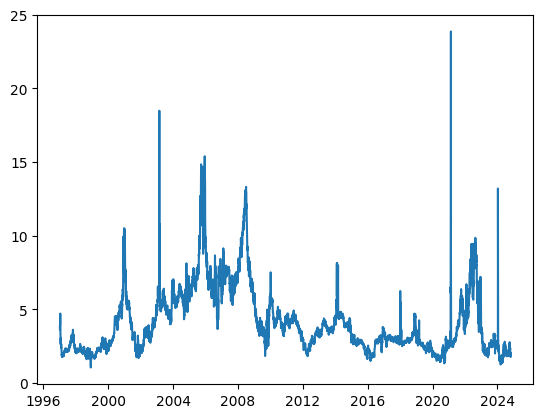

In [93]:
plt.plot(gas_prices['natural_gas_price'])

### Crude Oil Spot Prices

In [ ]:
# Petroleum spot prices metadata
url = f'https://api.eia.gov/v2/petroleum/pri/spt?api_key={EIA_KEY}'
api_get(url)

In [95]:
crude_oil_spot_prices = create_eia_df(root='https://api.eia.gov/v2/petroleum/pri/spt/data/', frequency='daily', data_col='value', sort='period', sort_direction='desc', offset=0, length=5000, facets=[('series', 'RWTC')])
oil_prices = crude_oil_spot_prices[['period', 'value']].rename(columns={'value': 'crude_oil_price'})
oil_prices = oil_prices.sort_values(by='period').set_index('period')
oil_prices

,crude_oil_price
period,
1986-01-02,25.56
1986-01-03,26.00
1986-01-06,26.53
1986-01-07,25.85
1986-01-08,25.87
...,...
2024-10-22,72.84
2024-10-23,71.37
2024-10-24,70.58


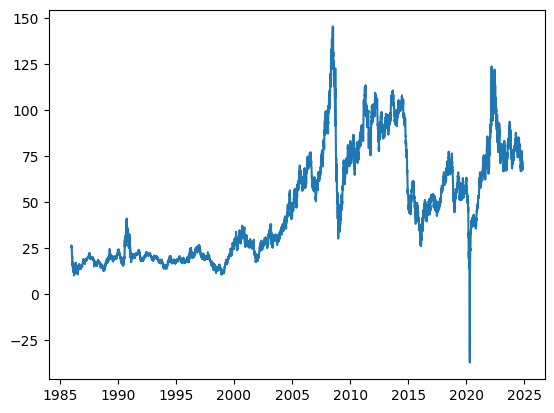

In [96]:
plt.plot(oil_prices['crude_oil_price'])

### Electricity Spot Prices
  North Carolina predominantly doesn't have an openly traded wholesale electricity market. However, PJM does have a North Carolina zone (Dominion). I figure we can pull historical, real-time electricity market prices from that zone as a proxy for our electricty spot prices in the predominant region served by Duke.

  Source: https://www.engieresources.com/historical-data#reports_anchor

In [97]:
elec_data_dir = '/content/drive/MyDrive/GitHubPortfolio/Electricity/data'

In [98]:
file_path = os.path.join(elec_data_dir, f'PJM/PJM-DailyAvg.RealTime.csv')
e_spot_prices = pd.read_csv(file_path)
e_spot_prices['HOURBEGINNING_TIME'] = pd.to_datetime(e_spot_prices['HOURBEGINNING_TIME'])
e_spot_prices = (e_spot_prices
                 .sort_values(by='HOURBEGINNING_TIME').reset_index(drop=True)
                 .rename(columns={'HOURBEGINNING_TIME': 'period', 'DOM': 'elec_spot_price'})
                 .set_index('period'))
e_spot_prices['elec_spot_price'] = e_spot_prices['elec_spot_price'].str.replace('$', '').astype(float)
e_spot_prices

<ipython-input-98-3769234f3d40>:3: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  e_spot_prices['HOURBEGINNING_TIME'] = pd.to_datetime(e_spot_prices['HOURBEGINNING_TIME'])


,elec_spot_price
period,
2006-01-01,37.37
2006-01-02,73.34
2006-01-03,80.69
2006-01-04,89.88
2006-01-05,48.03
...,...
2024-10-16,51.82
2024-10-17,55.04
2024-10-18,58.17


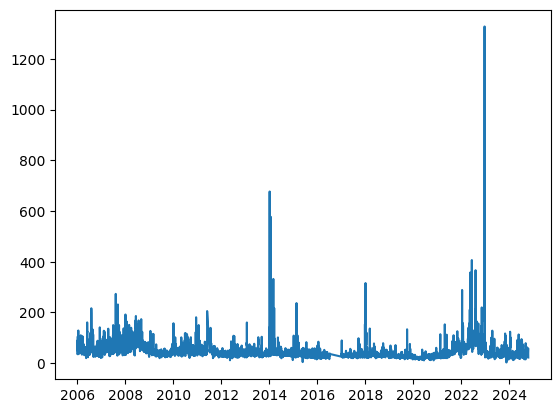

In [99]:
plt.plot(e_spot_prices['elec_spot_price'])

At first sight, I couldn't believe my eyes when I saw $1200/Mwh for electricity in this graph around 2023. I did some research to see if this was accurate and sure enough:

https://pemc.coop/peak-reduction-during-extreme-temperatures/

There was a huge snowstorm with extremely low temperatures in December 2022. We'll leave these large peaks in then.

### Let's join the EIA datasets together now
  Let's first filter each to the latest start date for each dataset

In [101]:
min(gas_prices.index), min(oil_prices.index), min(e_spot_prices.index)

(Timestamp('1997-01-07 00:00:00'),
 Timestamp('1986-01-02 00:00:00'),
 Timestamp('2006-01-01 00:00:00'))

In [102]:
gas_prices = gas_prices.loc['2006-01-03':] # gas and oil actually start on the 3rd (they don't have anything for the 1st or 2nd)
oil_prices = oil_prices.loc['2006-01-03':]


In [103]:
eia_datasets = pd.concat([gas_prices, oil_prices, e_spot_prices], axis=1, join='outer')
eia_datasets

,natural_gas_price,crude_oil_price,elec_spot_price
period,,,
2006-01-01,NaN,NaN,37.37
2006-01-02,NaN,NaN,73.34
2006-01-03,9.90,63.11,80.69
2006-01-04,9.25,63.41,89.88
2006-01-05,9.24,62.81,48.03
...,...,...,...
2024-10-22,1.76,72.84,NaN
2024-10-23,1.90,71.37,NaN
2024-10-24,2.04,70.58,NaN


In [104]:
eia_datasets.isna().sum()

,0
natural_gas_price,2053
crude_oil_price,2077
elec_spot_price,176


A quick check of some of these missing values between natural gas and crude oil is since they don't record values on weekends. The electricity spot price data, on the other hand, does have weekend data. In the interest of simplicity, here, we'll drop the NaN values altogether. There is obviously further analysis that could be performed if we really wanted to confirm what was here/missing and how to be handle the missing data.

Some ideas:
  Calc percentage of missing values that are truly weekend days
  Fill missing values in with mean or median depending on the distrbution
  Forward fill and backfill
  Etc.

In [105]:
eia_datasets = eia_datasets.dropna()
eia_datasets

,natural_gas_price,crude_oil_price,elec_spot_price
period,,,
2006-01-03,9.90,63.11,80.69
2006-01-04,9.25,63.41,89.88
2006-01-05,9.24,62.81,48.03
2006-01-06,9.30,64.21,69.58
2006-01-09,8.79,63.56,34.58
...,...,...,...
2024-10-11,2.31,76.11,28.17
2024-10-15,2.37,71.22,40.96
2024-10-16,2.21,70.97,51.82


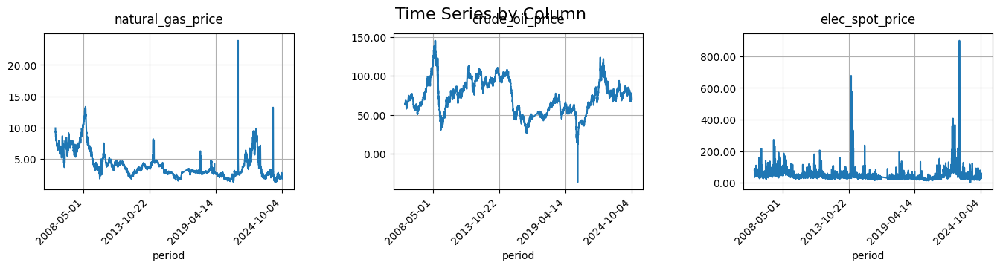

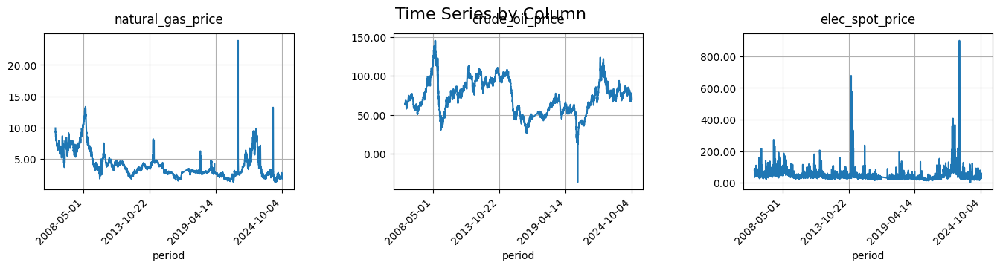

In [106]:
plot_timeseries_grid(eia_datasets)

So we'll need to handle outliers for these three data series as well. Let's first look at winsorization.

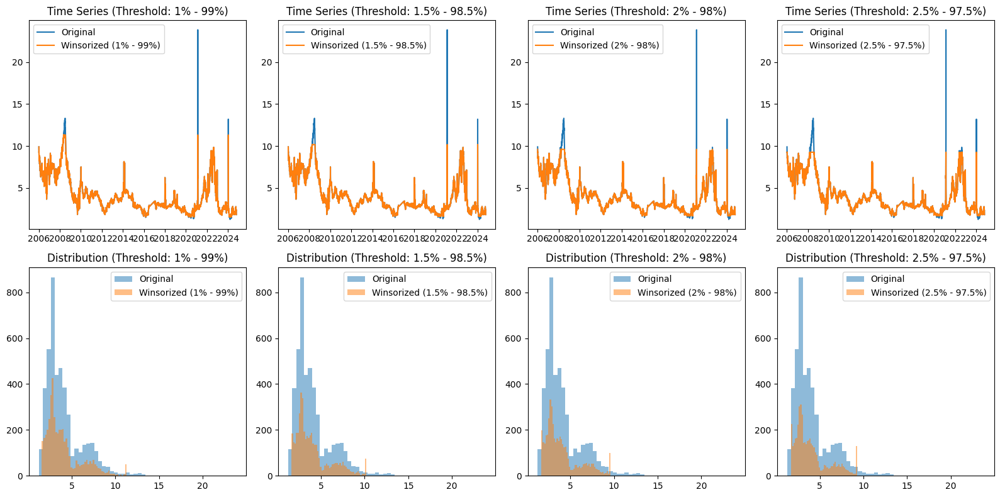

In [107]:
factor = 'natural_gas_price'
lower_thresholds = [1, 1.5, 2, 2.5]
upper_thresholds = [(100-i) for i in lower_thresholds]
factor_data = eia_datasets[factor]
plot_factor_data(factor_data, lower_thresholds, upper_thresholds)

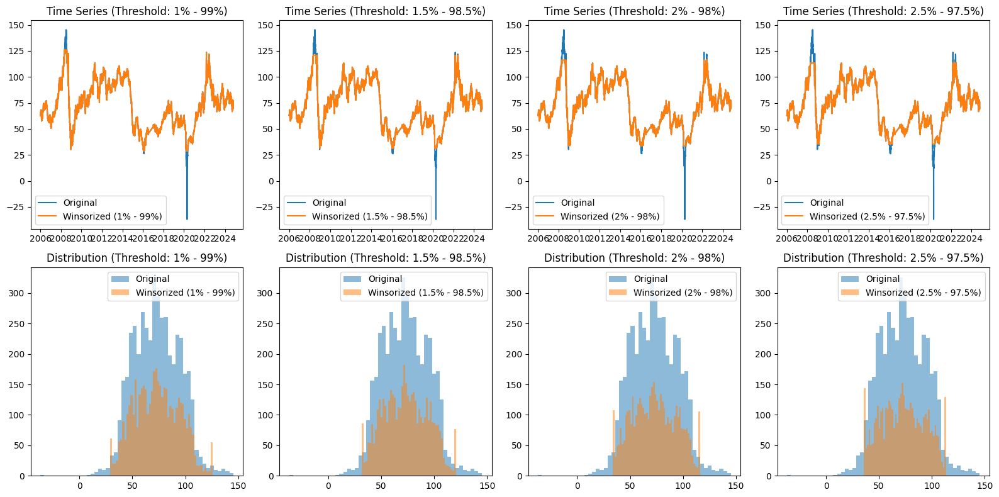

In [108]:
factor = 'crude_oil_price'
lower_thresholds = [1, 1.5, 2, 2.5]
upper_thresholds = [(100-i) for i in lower_thresholds]
factor_data = eia_datasets[factor]
plot_factor_data(factor_data, lower_thresholds, upper_thresholds)

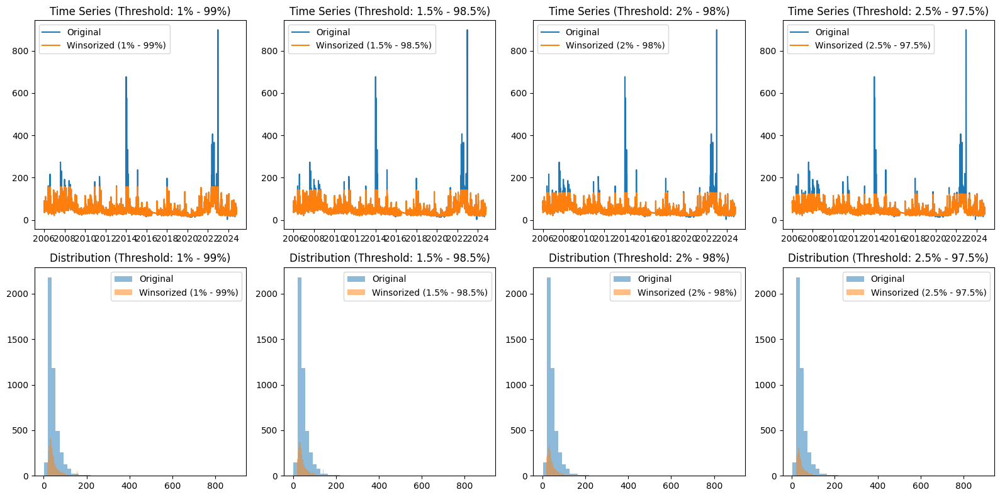

In [109]:
factor = 'elec_spot_price'
lower_thresholds = [1, 1.5, 2, 2.5]
upper_thresholds = [(100-i) for i in lower_thresholds]
factor_data = eia_datasets[factor]
plot_factor_data(factor_data, lower_thresholds, upper_thresholds)

It seems like 1/99 would help natural gas. I'm not sure any winsorization is even needed for coal prices. I'm not winsorization is the appropriate way to handle electricity spot prices. I want to look at log and sqrt transformations first...

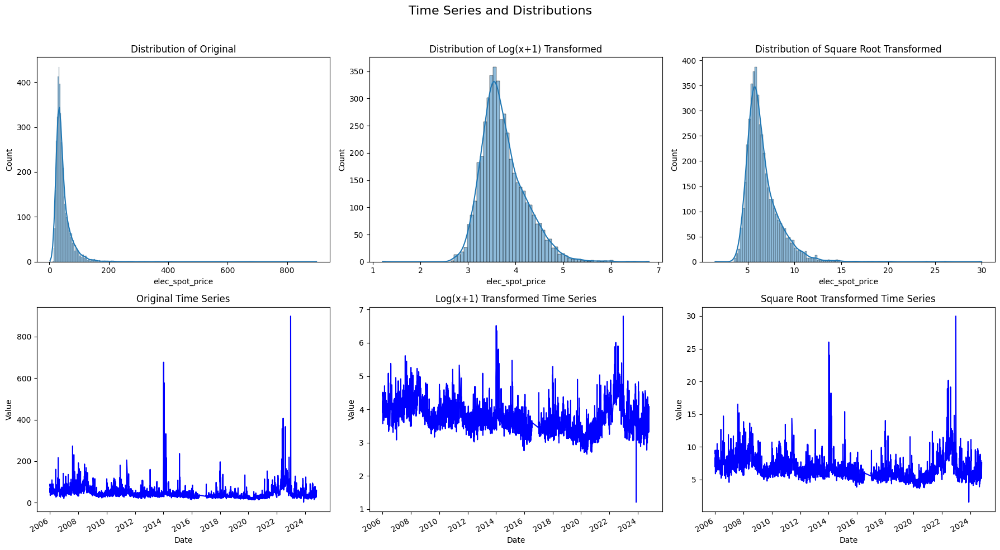

In [111]:
# Set up the grid for plotting
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
fig.suptitle('Time Series and Distributions', fontsize=16)

# Plot the original time series
plot_distribution_and_series(axes[0, 0], axes[1, 0], eia_datasets['elec_spot_price'], 'Original')

# Plot the log-transformed time series
plot_distribution_and_series(axes[0, 1], axes[1, 1], np.log1p(eia_datasets['elec_spot_price']), 'Log(x+1) Transformed')

# Plot the square root-transformed time series
plot_distribution_and_series(axes[0, 2], axes[1, 2], np.sqrt(eia_datasets['elec_spot_price']), 'Square Root Transformed')

plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout to fit the suptitle
plt.show()

log transformation looks like a good selection for elec spot prices

In [112]:
eia_datasets['natural_gas_price'] = winsorize_data(eia_datasets['natural_gas_price'], 1, 99)

<ipython-input-112-1cfac5257d61>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  eia_datasets['natural_gas_price'] = winsorize_data(eia_datasets['natural_gas_price'], 1, 99)


In [113]:
eia_datasets['elec_spot_price'] = np.log1p(eia_datasets['elec_spot_price'])

<ipython-input-113-5e28880b5084>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  eia_datasets['elec_spot_price'] = np.log1p(eia_datasets['elec_spot_price'])


## Get stock prices (and returns)

In [114]:
stock_symbol = 'DUK'  # Example: Apple Inc.
# start_date = '2023-01-01'
end_date = '2024-10-24'

# Download historical price data
price_data = yf.download(stock_symbol, end=end_date)

[*********************100%***********************]  1 of 1 completed


In [115]:
price_data

Price,Adj Close,Close,High,Low,Open,Volume
Ticker,DUK,DUK,DUK,DUK,DUK,DUK
Date,,,,,,
1980-03-17 00:00:00+00:00,0.787773,6.428419,6.646331,6.428419,0.000000,133540
1980-03-18 00:00:00+00:00,0.847858,6.918722,6.918722,6.428419,0.000000,224861
1980-03-19 00:00:00+00:00,0.821153,6.700809,6.973200,6.700809,0.000000,319394
1980-03-20 00:00:00+00:00,0.827829,6.755288,6.755288,6.646331,0.000000,118855
1980-03-21 00:00:00+00:00,0.821153,6.700809,6.755288,6.646331,0.000000,100270
...,...,...,...,...,...,...
2024-10-17 00:00:00+00:00,120.580002,120.580002,120.809998,119.480003,119.779999,4589900
2024-10-18 00:00:00+00:00,120.760002,120.760002,120.849998,119.620003,120.739998,3562300


In [116]:
# get log returns
price_data['rets'] = np.log(price_data['Adj Close'] / price_data['Adj Close'].shift(1))

In [117]:
price_data.index.name = 'period'

In [118]:
price_data

Price,Adj Close,Close,High,Low,Open,Volume,rets
Ticker,DUK,DUK,DUK,DUK,DUK,DUK,
period,,,,,,,
1980-03-17 00:00:00+00:00,0.787773,6.428419,6.646331,6.428419,0.000000,133540,NaN
1980-03-18 00:00:00+00:00,0.847858,6.918722,6.918722,6.428419,0.000000,224861,0.073503
1980-03-19 00:00:00+00:00,0.821153,6.700809,6.973200,6.700809,0.000000,319394,-0.032004
1980-03-20 00:00:00+00:00,0.827829,6.755288,6.755288,6.646331,0.000000,118855,0.008097
1980-03-21 00:00:00+00:00,0.821153,6.700809,6.755288,6.646331,0.000000,100270,-0.008097
...,...,...,...,...,...,...,...
2024-10-17 00:00:00+00:00,120.580002,120.580002,120.809998,119.480003,119.779999,4589900,0.006657
2024-10-18 00:00:00+00:00,120.760002,120.760002,120.849998,119.620003,120.739998,3562300,0.001492


### Join everything together

In [120]:
sentiments_daily.index = sentiments_daily.index.strftime('%Y-%m-%d')
duk_ff_daily.index = duk_ff_daily.index.strftime('%Y-%m-%d')
avg_weather_df.index = avg_weather_df.index.strftime('%Y-%m-%d')
eia_datasets.index = eia_datasets.index.strftime('%Y-%m-%d')
price_data.index = price_data.index.strftime('%Y-%m-%d')

In [121]:
master_df = pd.concat([duk_ff_daily, sentiments_daily, avg_weather_df, eia_datasets, price_data['rets']], axis=1)
master_df = (master_df
             .sort_index(ascending=True)
             .loc['2009-06-30':'2024-06-30'] # time period that matters since fundamentals only went this far
             .dropna())
master_df

,netProfitMargin,debtEquityRatio,assetTurnoverRatio,currentRatio,quickRatio,cashRatio,netProfitMargin_QoQ_Growth,netProfitMargin_4Q_MA,netProfitMargin_12Q_MA,netProfitMargin_YOY,...,sentiment_score,temperature_2m_mean,sunshine_duration,rain_sum,snowfall_sum,wind_speed_10m_max,natural_gas_price,crude_oil_price,elec_spot_price,rets
period,,,,,,,,,,,,,,,,,,,,,
2012-04-02,0.081267,0.872991,0.059728,1.226393,0.948583,0.397263,-0.049625,0.102235,0.094713,-0.417452,...,0.918323,20.108131,41165.718750,0.294800,0.0,15.690971,1.88,105.25,3.313458,0.004275
2012-04-03,0.081267,0.872991,0.059728,1.226393,0.948583,0.397263,-0.049625,0.102235,0.094713,-0.417452,...,0.918323,19.859917,30548.437500,0.217413,0.0,11.497199,1.94,104.02,3.450622,0.001894
2012-04-04,0.081267,0.872991,0.059728,1.226393,0.948583,0.397263,-0.049625,0.102235,0.094713,-0.417452,...,0.918323,21.107836,41125.464844,0.028171,0.0,14.970779,2.06,101.53,3.255401,0.002362
2012-04-05,0.081267,0.872991,0.059728,1.226393,0.948583,0.397263,-0.049625,0.102235,0.094713,-0.417452,...,0.918323,17.735514,31626.339844,2.645161,0.0,19.867113,1.98,103.29,3.174297,-0.020501
2012-04-09,0.081267,0.872991,0.059728,1.226393,0.948583,0.397263,-0.049625,0.102235,0.094713,-0.417452,...,0.918323,16.671526,41626.746094,0.228842,0.0,17.478073,1.99,102.45,3.597038,-0.007252
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-06-24,0.166034,1.688805,0.038361,0.777756,0.502380,0.029525,0.060473,0.114602,0.121246,0.353883,...,0.412813,28.034571,47358.933594,0.294800,0.0,15.766682,2.58,82.63,3.466048,0.016588
2024-06-25,0.166034,1.688805,0.038361,0.777756,0.502380,0.029525,0.060473,0.114602,0.121246,0.353883,...,0.412813,27.554811,44531.933594,0.603535,0.0,14.528638,2.61,81.97,3.296207,-0.012989
2024-06-26,0.166034,1.688805,0.038361,0.777756,0.502380,0.029525,0.060473,0.114602,0.121246,0.353883,...,0.412813,27.685764,37779.355469,1.223776,0.0,16.022404,2.45,82.19,3.585739,-0.002498


In [122]:
master_df.to_feather('/content/drive/My Drive/GitHubPortfolio/QuantDevProject/data/raw_master_df.ftr')

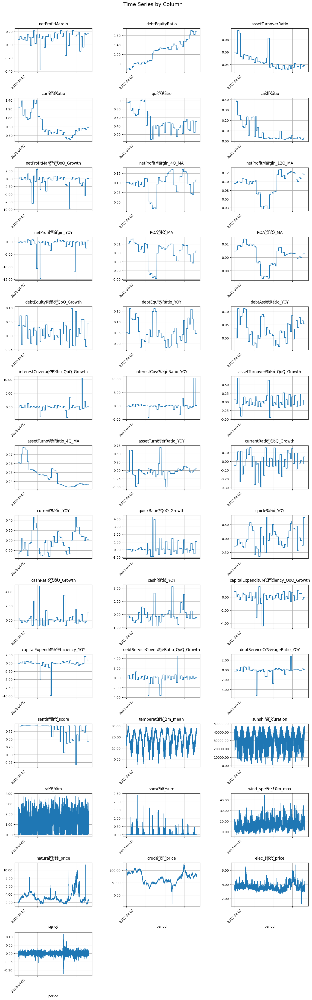

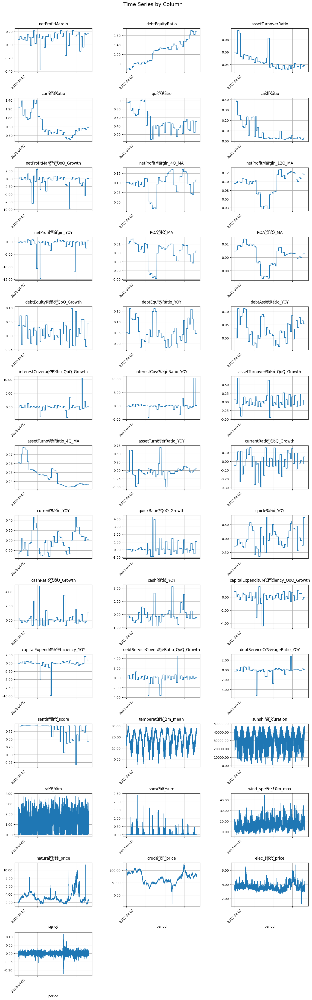

In [123]:
plot_timeseries_grid(master_df)

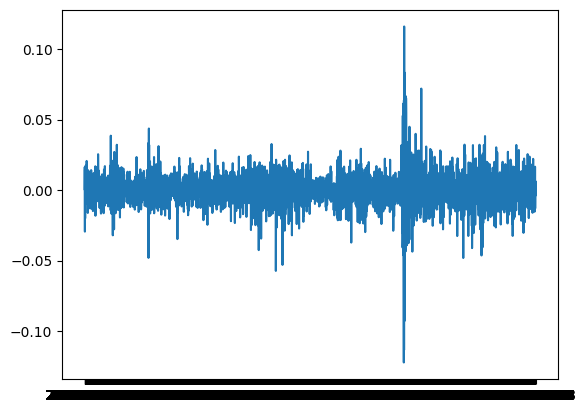

In [ ]:
plt.plot(master_df['rets'])

In [4]:
data = pd.read_feather('/content/drive/My Drive/GitHubPortfolio/QuantDevProject/data/raw_master_df.ftr')

In [5]:
data.head()

,netProfitMargin,debtEquityRatio,assetTurnoverRatio,currentRatio,quickRatio,cashRatio,netProfitMargin_QoQ_Growth,netProfitMargin_4Q_MA,netProfitMargin_12Q_MA,netProfitMargin_YOY,...,sentiment_score,temperature_2m_mean,sunshine_duration,rain_sum,snowfall_sum,wind_speed_10m_max,natural_gas_price,crude_oil_price,elec_spot_price,rets
period,,,,,,,,,,,,,,,,,,,,,
2012-04-02,0.081267,0.872991,0.059728,1.226393,0.948583,0.397263,-0.049625,0.102235,0.094713,-0.417452,...,0.918323,20.108131,41165.718750,0.294800,0.0,15.690971,1.88,105.25,3.313458,0.004275
2012-04-03,0.081267,0.872991,0.059728,1.226393,0.948583,0.397263,-0.049625,0.102235,0.094713,-0.417452,...,0.918323,19.859917,30548.437500,0.217413,0.0,11.497199,1.94,104.02,3.450622,0.001894
2012-04-04,0.081267,0.872991,0.059728,1.226393,0.948583,0.397263,-0.049625,0.102235,0.094713,-0.417452,...,0.918323,21.107836,41125.464844,0.028171,0.0,14.970779,2.06,101.53,3.255401,0.002362
2012-04-05,0.081267,0.872991,0.059728,1.226393,0.948583,0.397263,-0.049625,0.102235,0.094713,-0.417452,...,0.918323,17.735514,31626.339844,2.645161,0.0,19.867113,1.98,103.29,3.174297,-0.020501
2012-04-09,0.081267,0.872991,0.059728,1.226393,0.948583,0.397263,-0.049625,0.102235,0.094713,-0.417452,...,0.918323,16.671526,41626.746094,0.228842,0.0,17.478073,1.99,102.45,3.597038,-0.007252


In [6]:
ticker = 'DUK'
lookahead = 1

In [7]:
data = data.rename(columns={'rets': f'{ticker}_rets'})

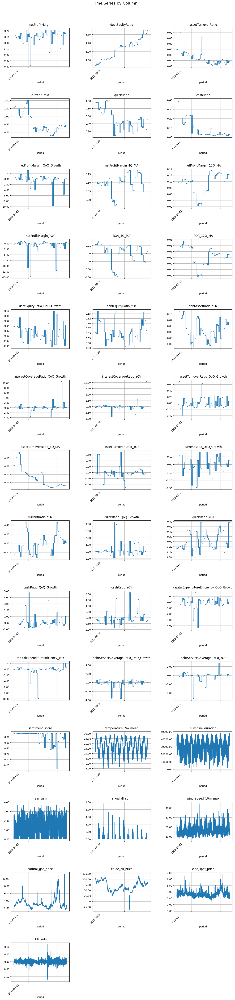

In [10]:
fig = plot_timeseries_grid(
    data,
    plots_per_row=3,
    height_per_plot=4,      # Increase this for more vertical space
    width_per_plot=5,
    h_spacing=0.4,
    v_spacing=0.8          # Increase this for more space between rows
)
plt.show()

In [11]:
def standardize_df(data, scaler=RobustScaler()):
    # Separate features and target
    df_index = data.index
    X = data.iloc[:, :-1]  # All columns except the last
    y = data.iloc[:, -1]   # The last column (target)
    target_name = y.name

    # Standardize the feature columns

    scaler = scaler
    X_scaled = scaler.fit_transform(X)

    # Convert back to a DataFrame and combine with the target column
    df_scaled = pd.DataFrame(X_scaled, columns=X.columns)
    df_scaled[f'{target_name}'] = y.values  # Add the target column back
    df_scaled.index = df_index

    return df_scaled

In [12]:
# pre-process the data
# shift returns so we're forecasting the lookahead period
data[f'{ticker}_rets'] = data[f'{ticker}_rets'].shift(-lookahead)
data.dropna(inplace=True)

In [13]:
# normalization/standardization
scaled_data = standardize_df(data, scaler=StandardScaler())
scaled_data.head()

,netProfitMargin,debtEquityRatio,assetTurnoverRatio,currentRatio,quickRatio,cashRatio,netProfitMargin_QoQ_Growth,netProfitMargin_4Q_MA,netProfitMargin_12Q_MA,netProfitMargin_YOY,...,sentiment_score,temperature_2m_mean,sunshine_duration,rain_sum,snowfall_sum,wind_speed_10m_max,natural_gas_price,crude_oil_price,elec_spot_price,DUK_rets
period,,,,,,,,,,,,,,,,,,,,,
2012-04-02,-0.210867,-1.654433,1.071872,1.51992,1.660471,3.123198,0.326617,0.172002,0.056509,0.204115,...,0.563605,0.339643,0.879365,-0.781694,-0.181432,-0.130142,-0.992397,1.634502,-0.681128,0.001894
2012-04-03,-0.210867,-1.654433,1.071872,1.51992,1.660471,3.123198,0.326617,0.172002,0.056509,0.204115,...,0.563605,0.305370,-0.149889,-0.867307,-0.181432,-1.068703,-0.949427,1.578138,-0.382573,0.002362
2012-04-04,-0.210867,-1.654433,1.071872,1.51992,1.660471,3.123198,0.326617,0.172002,0.056509,0.204115,...,0.563605,0.477683,0.875463,-1.076666,-0.181432,-0.291320,-0.863488,1.464037,-0.807499,-0.020501
2012-04-05,-0.210867,-1.654433,1.071872,1.51992,1.660471,3.123198,0.326617,0.172002,0.056509,0.204115,...,0.563605,0.012031,-0.045395,1.818517,-0.181432,0.804473,-0.920781,1.544687,-0.984032,-0.007252
2012-04-09,-0.210867,-1.654433,1.071872,1.51992,1.660471,3.123198,0.326617,0.172002,0.056509,0.204115,...,0.563605,-0.134885,0.924058,-0.854663,-0.181432,0.269809,-0.913619,1.506195,-0.063880,-0.011713
